**Load data to colab computer**

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
!ls /content/gdrive/MyDrive/laneDetection/laneDetectionData3.zip

/content/gdrive/MyDrive/laneDetection/laneDetectionData3.zip


In [ ]:
!ls /content/gdrive/MyDrive/laneDetection/DataAugmentation.zip

/content/gdrive/MyDrive/laneDetection/DataAugmentation.zip


In [ ]:
!unzip /content/gdrive/MyDrive/laneDetection/laneDetectionData3.zip

Archive:  /content/gdrive/MyDrive/laneDetection/laneDetectionData3.zip
   creating: Train/
  inflating: Train/F61-1.png         
  inflating: Train/F61-100.png       
  inflating: Train/F61-11.png        
  inflating: Train/F61-12.png        
  inflating: Train/F61-13.png        
  inflating: Train/F61-14.png        
  inflating: Train/F61-15.png        
  inflating: Train/F61-16.png        
  inflating: Train/F61-17.png        
  inflating: Train/F61-19.png        
  inflating: Train/F61-2.png         
  inflating: Train/F61-20.png        
  inflating: Train/F61-21.png        
  inflating: Train/F61-22.png        
  inflating: Train/F61-25.png        
  inflating: Train/F61-26.png        
  inflating: Train/F61-27.png        
  inflating: Train/F61-29.png        
  inflating: Train/F61-3.png         
  inflating: Train/F61-30.png        
  inflating: Train/F61-31.png        
  inflating: Train/F61-32.png        
  inflating: Train/F61-33.png        
  inflating: Train/F61-34.png      

In [ ]:
!unzip /content/gdrive/MyDrive/laneDetection/DataAugmentation.zip

Kết quả truyền trực tuyến bị cắt bớt đến 5000 dòng cuối.
  inflating: Train_Aug/Augmentation_5499.png  
  inflating: Train_Aug/Augmentation_55.png  
  inflating: Train_Aug/Augmentation_550.png  
  inflating: Train_Aug/Augmentation_5500.png  
  inflating: Train_Aug/Augmentation_5501.png  
  inflating: Train_Aug/Augmentation_5502.png  
  inflating: Train_Aug/Augmentation_5503.png  
  inflating: Train_Aug/Augmentation_5504.png  
  inflating: Train_Aug/Augmentation_5505.png  
  inflating: Train_Aug/Augmentation_5506.png  
  inflating: Train_Aug/Augmentation_5507.png  
  inflating: Train_Aug/Augmentation_5508.png  
  inflating: Train_Aug/Augmentation_5509.png  
  inflating: Train_Aug/Augmentation_551.png  
  inflating: Train_Aug/Augmentation_5510.png  
  inflating: Train_Aug/Augmentation_5511.png  
  inflating: Train_Aug/Augmentation_5512.png  
  inflating: Train_Aug/Augmentation_5513.png  
  inflating: Train_Aug/Augmentation_5514.png  
  inflating: Train_Aug/Augmentation_5515.png  
  infla

In [ ]:
!ls

gdrive	     Train	Train_label	 Val
sample_data  Train_Aug	Train_Label_Aug  Val_label


training data: 10194  images
validation data: 145  images


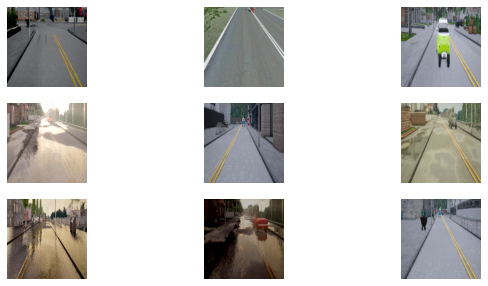

In [ ]:
import tensorflow as tf
from pathlib import Path
train_folder = Path('Train_Aug/')
val_folder = Path('Val/')  # label_name = filename 

train_size = len(list(train_folder.glob('*')))
val_size = len(list(val_folder.glob('*')))
print('training data:',train_size,' images')
print('validation data:',val_size,' images')

# for item in train_folder.glob('*'):
#   print(item.name)
filelist_ds = tf.data.Dataset.list_files(str(train_folder/'*'))
vallist_ds = tf.data.Dataset.list_files(str(val_folder/'*'))

import matplotlib.pyplot as plt
plt.figure(figsize=(10, 5))
for i,file in enumerate(filelist_ds.take(9)):\
  # print(file)
  ax = plt.subplot(3, 3, i + 1)
  img = tf.io.read_file(file)
  img = tf.image.decode_png(img, channels=3)
  plt.imshow(img.numpy().astype("uint8"))
  # plt.title(str(file))
  plt.axis("off")


In [ ]:
def get_label_path(file_path):
  file_path = tf.strings.regex_replace(file_path, "Train_Aug/", "Train_Label_Aug/")
  file_path = tf.strings.regex_replace(file_path, "Val/", "Val_label/")
#   file_path = tf.strings.regex_replace(file_path, ".png", ".png")
  return file_path

for file in filelist_ds.take(9):
  print(f'Data: {file.numpy()}  label: {get_label_path(file).numpy()}')


Data: b'Train_Aug/Augmentation_4714.png'  label: b'Train_Label_Aug/Augmentation_4714.png'
Data: b'Train_Aug/Augmentation_332.png'  label: b'Train_Label_Aug/Augmentation_332.png'
Data: b'Train_Aug/Augmentation_3420.png'  label: b'Train_Label_Aug/Augmentation_3420.png'
Data: b'Train_Aug/Augmentation_2995.png'  label: b'Train_Label_Aug/Augmentation_2995.png'
Data: b'Train_Aug/Augmentation_5978.png'  label: b'Train_Label_Aug/Augmentation_5978.png'
Data: b'Train_Aug/Augmentation_6581.png'  label: b'Train_Label_Aug/Augmentation_6581.png'
Data: b'Train_Aug/Augmentation_2312.png'  label: b'Train_Label_Aug/Augmentation_2312.png'
Data: b'Train_Aug/Augmentation_3351.png'  label: b'Train_Label_Aug/Augmentation_3351.png'
Data: b'Train_Aug/Augmentation_2248.png'  label: b'Train_Label_Aug/Augmentation_2248.png'


In [ ]:
img_height = 128
img_width = 128
crop_height = 128
crop_width = 128

# class Augment(tf.keras.layers.Layer):
#   def __init__(self,seed=42):
#     super().__init__()
#     # both use the same seed, so they'll make the same random changes.
#     self.Flip_inputs = tf.keras.layers.RandomFlip(mode="horizontal", seed=seed)
#     self.Flip_labels = tf.keras.layers.RandomFlip(mode="horizontal", seed=seed)

#     self.Crop_inputs = tf.keras.layers.RandomCrop(crop_height,crop_width,seed= seed) 
#     self.Crop_labels = tf.keras.layers.RandomCrop(crop_height,crop_width,seed= seed) 

    
#     self.seed= seed

#   def call(self, inputs, labels):
#     inputs = self.Flip_inputs(inputs)
#     inputs = self.Crop_inputs(inputs)
#     inputs = tf.image.random_brightness(inputs,0.2)

#     labels = self.Flip_labels(labels)
#     labels = self.Crop_labels(labels)
#     labels = tf.py_function(thresHold,inp=[labels],Tout=tf.float32)
#     labels.set_shape((crop_height,crop_width,1))
#     return inputs, labels
def thresHold (input):
    input = input.numpy()
    output = (input !=0)*1.0
    return output
def preprocessing(file_path):

    height = img_height
    width = img_width

    # read file
    img = tf.io.read_file(file_path)
    img = tf.image.decode_png(img, channels=3)
    # augmentation
    # convert from uint8 to float32 and normalize to [0 1]
    img = tf.image.convert_image_dtype(img,tf.float32)
    # resize
    img = tf.image.resize(img, [width, height])
    # get label
    label = tf.io.read_file(get_label_path(file_path))
    label = tf.image.decode_png(label, channels=1)
    label = tf.image.convert_image_dtype(label,tf.float32)
    label = tf.image.resize(label, [width, height])
    label = tf.py_function(thresHold,inp=[label],Tout=tf.float32)
    label.set_shape((width,height,1))
    # return
    return img, label


In [ ]:
batch_size = 128
# Build training dataset
train_ds = filelist_ds.shuffle(train_size)
train_ds = train_ds.map(preprocessing)
train_ds = train_ds.batch(batch_size)
train_ds = train_ds.prefetch(1)
# Build validation dataset
val_ds = vallist_ds.shuffle(val_size)
val_ds = val_ds.map(preprocessing)
val_ds = val_ds.batch(64)

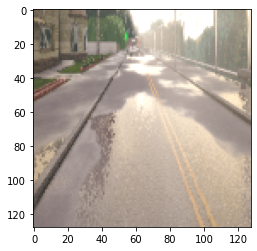

unique elements in label:  [0. 1.]


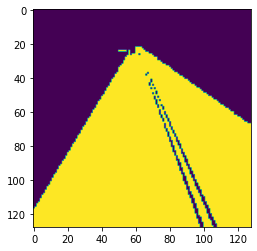

In [ ]:
# Check Label
import numpy as np
it = iter(train_ds) 
img,label = next(it)
imgLabel =label[0]
# print(img[0])
imgLabel =imgLabel.numpy()
input = imgLabel
inside = np.unique(imgLabel)
plt.imshow(img[0])
plt.show()
print('unique elements in label: ',inside)
plt.imshow(imgLabel.reshape(128,128))

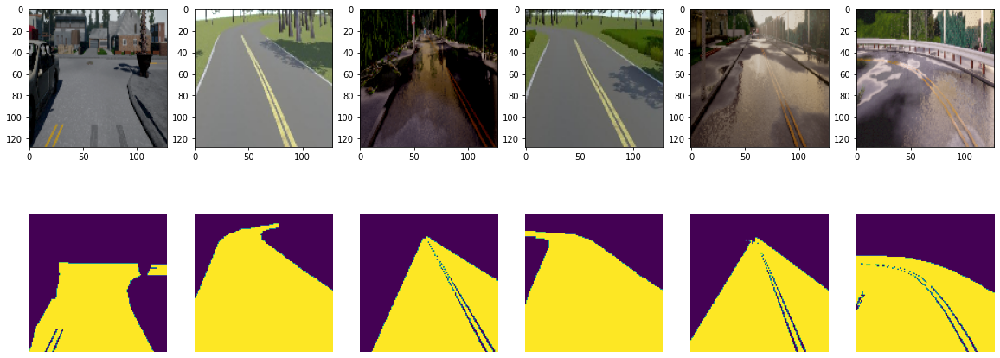

In [ ]:
# Visulize the data
import matplotlib.pyplot as plt

plt.figure(figsize=(20, 8))
for images,labels in train_ds.take(1):
  for i in range(6):
    ax = plt.subplot(2, 6, i + 1)
    plt.imshow((255*images[i]).numpy().astype("uint8"))
    ax = plt.subplot(2, 6, i + 7)
    # print(labels)
    plt.imshow(tf.keras.utils.array_to_img(labels[i]))
    plt.axis("off")

In [ ]:
# ResNet34 Model
import tensorflow as tf
from tensorflow.keras import layers
# Create identify blocks
def identity_block(x, filter):
    # copy tensor to variable called x_skip
    x_skip = x
    # Layer 1
    x = layers.Conv2D(filter, (3,3), padding = 'same')(x)
    x = layers.BatchNormalization(axis=3)(x)
    x = layers.Activation('relu')(x)
    # Layer 2
    x = layers.Conv2D(filter, (3,3), padding = 'same')(x)
    x = layers.BatchNormalization(axis=3)(x)
    # Add Residue
    x = layers.Add()([x, x_skip])     
    x = layers.Activation('relu')(x)
    return x
  
# Create convolution (bottle neck) blocks
def convolutional_block(x, filter):
    # copy tensor to variable called x_skip
    x_skip = x
    # Layer 1
    # stride 2 to minimize the size of the image
    x = layers.Conv2D(filter, (3,3), padding = 'same', strides = (2,2))(x)
    x = layers.BatchNormalization(axis=3)(x)
    x = layers.Activation('relu')(x)
    # Layer 2
    x = layers.Conv2D(filter, (3,3), padding = 'same')(x)
    x = layers.BatchNormalization(axis=3)(x)
    # Processing Residue with conv(1,1)
    x_skip = layers.Conv2D(filter, (1,1), strides = (2,2))(x_skip)
    # Add Residue
    x = layers.Add()([x, x_skip])     
    x = layers.Activation('relu')(x)
    return x
def ResNet34(image_shape = (512,512, 3), classes = 10):
    # Step 1 (Setup Input Layer)
    x_input = layers.Input(image_shape)
    # x = layers.ZeroPadding2D((3, 3))(x_input)
    # Step 2 (Initial Conv layer along with maxPool)
    x = layers.Conv2D(64, kernel_size=7, strides=2, padding='same')(x_input)
    x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)
    x = layers.MaxPool2D(pool_size=3, strides=2, padding='same')(x)
    # Define size of sub-blocks and initial filter size
    block_layers = [3, 4, 6, 3]
    filter_size = 64
    # Step 3 Add the Resnet Blocks
    for i in range(4):
        if i == 0:
            # For sub-block 1 Residual/Convolutional block not needed
            for j in range(block_layers[i]):
                x = identity_block(x, filter_size)
        else:
            # One Residual/Convolutional Block followed by Identity blocks
            # The filter size will go on increasing by a factor of 2
            filter_size = filter_size*2
            x = convolutional_block(x, filter_size)
            for j in range(block_layers[i] - 1):
                x = identity_block(x, filter_size)
    # Step 4 End Dense Network
    x = layers.AveragePooling2D((2,2), padding = 'same')(x)
    x = layers.Flatten()(x)
    x = layers.Dense(512, activation = 'relu')(x)
    x = layers.Dense(classes, activation = 'softmax')(x)
    model = tf.keras.Model(inputs = x_input, outputs = x, name = "ResNet34")
    return model


In [ ]:
# Create Model UNet34


def EncoderBlock(input, n_filters, n_layers, dropout_prob, conv_block=True):
  if not conv_block: # Residual/Convolutional block is not needed
      for i in range(n_layers):
          x = identity_block(input, n_filters)
  if conv_block:  # One Residual/Convolutional Block followed by Identity blocks
      x = convolutional_block(input, n_filters)
      for j in range(n_layers - 1):
          x = identity_block(x, n_filters)
  skip_layer = x
  # add dropout for better performance
  if dropout_prob > 0:
      next_layer = layers.Dropout(dropout_prob)(x) 
  else:
      next_layer = x
  return next_layer, skip_layer
# Decoder Blocks
def DecoderBlock(prev_layer, skip_layer, n_filters, dropout_prob):
  # Upsampling
  upConv = layers.Conv2DTranspose(n_filters, 3, strides=(2,2), padding='same')(prev_layer)
  # Concatenate skip connection
  upConv = layers.concatenate([upConv, skip_layer], axis=3)
  upConv = layers.Dropout(dropout_prob)(upConv)   # dropout for better training
  # (3x3 conv -> Relu) x2
  conv = layers.Conv2D(n_filters, 3, activation='relu', padding='same', kernel_initializer='HeNormal')(upConv)   
  conv = layers.Conv2D(n_filters, 3, activation='relu', padding='same', kernel_initializer='HeNormal')(conv)    
  return conv

def UNet34(image_shape=(512,512,3), n_filters=64, n_classes=3, dropout_prob=0.3):
  # Step 1 Define model input
  input = tf.keras.Input(shape=image_shape)
  # ResNet34 as Encoder
  # Step 2 (Initial Conv layer along with maxPool)
  x = layers.Conv2D(64, kernel_size=7, strides=2, padding='same')(input)
  x = layers.BatchNormalization()(x)
  x = layers.Activation('relu')(x)
  skip_layer1 = x
  x = layers.MaxPool2D(pool_size=3, strides=2, padding='same')(x)
  # Define size of sub-blocks and initial filter size
  block_layers = [3, 4, 6, 3]
  # Step 3 Add the Resnet Blocks
  encoder, skip_layer2 = EncoderBlock(x, n_filters, block_layers[0], dropout_prob, conv_block=False)
  encoder, skip_layer3 = EncoderBlock(encoder, 2*n_filters, block_layers[1], dropout_prob)
  encoder, skip_layer4 = EncoderBlock(encoder, 4*n_filters, block_layers[2], dropout_prob)
  bridge = EncoderBlock(encoder, 8*n_filters, block_layers[3], dropout_prob)[0] # no skip-connection for bridge block
  # Decoder
  decoder = DecoderBlock(bridge, skip_layer4, 4*n_filters, dropout_prob)
  decoder = DecoderBlock(decoder, skip_layer3, 2*n_filters, dropout_prob)
  decoder = DecoderBlock(decoder, skip_layer2, n_filters, dropout_prob)
  decoder = DecoderBlock(decoder, skip_layer1, n_filters/2, dropout_prob)
  # last decoder layer (no skip connection)
  decoder = layers.Conv2DTranspose(n_filters, 3, strides=(2,2), padding='same')(decoder)
  decoder = layers.Dropout(dropout_prob)(decoder)
  decoder = layers.Conv2D(n_filters, 3, activation='relu', padding='same', kernel_initializer='HeNormal')(decoder)   
  decoder = layers.Conv2D(n_filters, 3, activation='relu', padding='same', kernel_initializer='HeNormal')(decoder)  
  # model output
  output = layers.Conv2D(n_classes, 1, padding='same', activation='sigmoid')(decoder)
  # Unet model
  unet_model = tf.keras.Model(input, output, name="U-Net")

  return unet_model

imageShape = (128,128,3)
model = UNet34(image_shape=imageShape, n_classes=1)
model.summary()

Model: "U-Net"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 128, 128, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 64, 64, 64)   9472        ['input_1[0][0]']                
                                                                                                  
 batch_normalization (BatchNorm  (None, 64, 64, 64)  256         ['conv2d[0][0]']                 
 alization)                                                                                       
                                                                                              

In [ ]:
# Compile model   
model.compile(optimizer=tf.keras.optimizers.Adam(),
                loss='binary_crossentropy',
                  metrics=['binary_accuracy'])


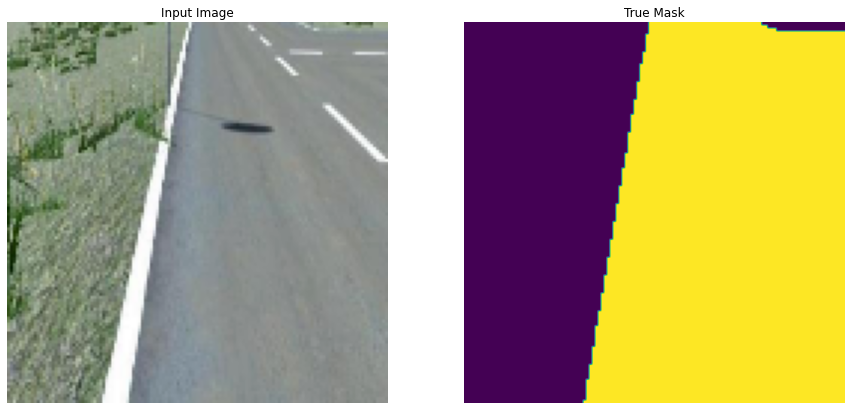

In [ ]:
# Display function to display the results
from IPython.display import clear_output

def display(display_list):
  plt.figure(figsize=(15, 15))

  title = ['Input Image', 'True Mask', 'Predicted Mask']

  for i in range(len(display_list)):
    plt.subplot(1, len(display_list), i+1)
    plt.title(title[i])
    plt.imshow(tf.keras.utils.array_to_img(display_list[i]))
    plt.axis('off')
  plt.show()
for images, masks in train_ds.take(1):
  sample_image, sample_mask = images[0], masks[0]
  display([sample_image, sample_mask])
def create_mask(pred_mask):
  # pred_mask = tf.math.argmax(pred_mask, axis=-1)
  # pred_mask = pred_mask[..., tf.newaxis]
  
  # pred_mask = pred_mask >= 0.7
  return pred_mask
def show_predictions(dataset=None, num=1):
  if dataset:
    for image, mask in dataset.take(num):
      pred_mask = model.predict(image)
      display([image[0], mask[0], create_mask(pred_mask).reshape((128,128,1))])
  else:
    display([sample_image, sample_mask,
             create_mask(model.predict(sample_image[tf.newaxis, ...])).reshape((128,128,1))])

class DisplayCallback(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs=None):
    # clear_output(wait=True)
    show_predictions()
    print ('\nSample Prediction after epoch {}\n'.format(epoch+1))

Epoch 1/50
70/80 [=========================>....] - ETA: 8s - loss: 0.2573 - binary_accuracy: 0.8805
Epoch 1: saving model to training_2/cp-0001.ckpt
1/1 [==============================] - 1s 1s/step


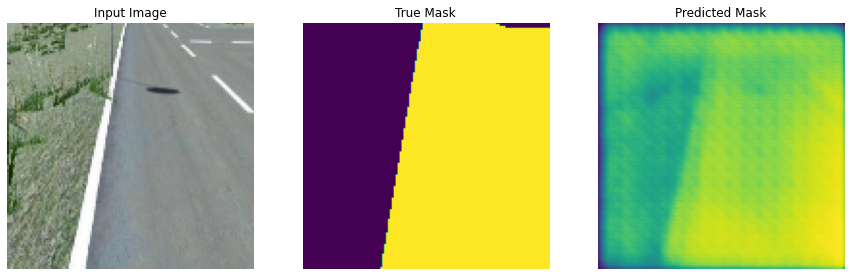


Sample Prediction after epoch 1

80/80 [==============================] - 95s 964ms/step - loss: 0.2382 - binary_accuracy: 0.8906 - val_loss: 1.1765 - val_binary_accuracy: 0.4621
Epoch 2/50
61/80 [=====================>........] - ETA: 15s - loss: 0.0880 - binary_accuracy: 0.9663
Epoch 2: saving model to training_2/cp-0002.ckpt
1/1 [==============================] - 0s 20ms/step


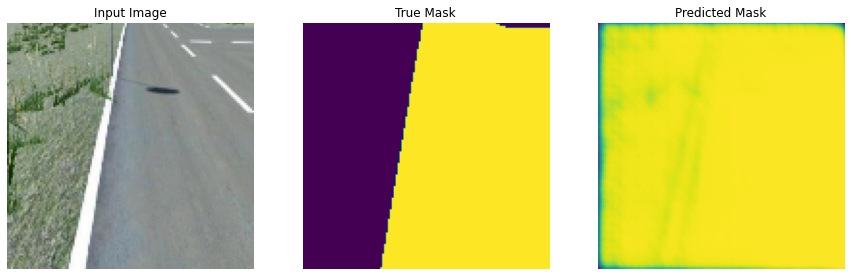


Sample Prediction after epoch 2

80/80 [==============================] - 67s 836ms/step - loss: 0.0838 - binary_accuracy: 0.9677 - val_loss: 2.9333 - val_binary_accuracy: 0.4653
Epoch 3/50
52/80 [==================>...........] - ETA: 22s - loss: 0.0576 - binary_accuracy: 0.9773
Epoch 3: saving model to training_2/cp-0003.ckpt
1/1 [==============================] - 0s 25ms/step


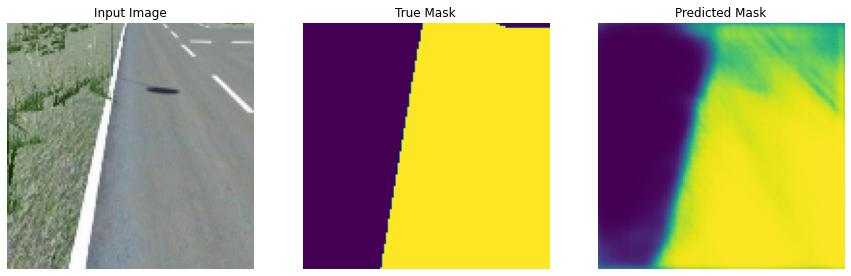


Sample Prediction after epoch 3

80/80 [==============================] - 67s 835ms/step - loss: 0.0601 - binary_accuracy: 0.9766 - val_loss: 0.4380 - val_binary_accuracy: 0.8322
Epoch 4/50
43/80 [===============>..............] - ETA: 29s - loss: 0.0814 - binary_accuracy: 0.9711
Epoch 4: saving model to training_2/cp-0004.ckpt
1/1 [==============================] - 0s 23ms/step


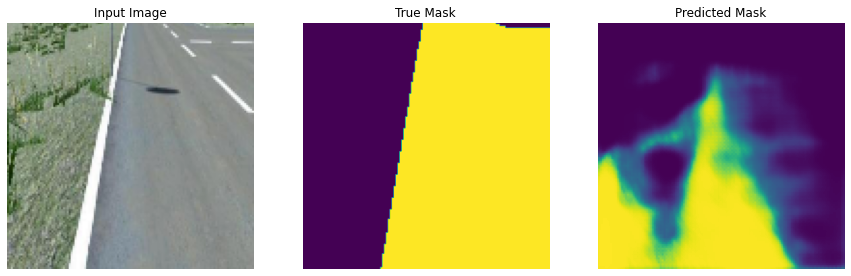


Sample Prediction after epoch 4

80/80 [==============================] - 66s 831ms/step - loss: 0.0816 - binary_accuracy: 0.9704 - val_loss: 0.6209 - val_binary_accuracy: 0.8084
Epoch 5/50
34/80 [===========>..................] - ETA: 37s - loss: 0.0560 - binary_accuracy: 0.9785
Epoch 5: saving model to training_2/cp-0005.ckpt
1/1 [==============================] - 0s 20ms/step


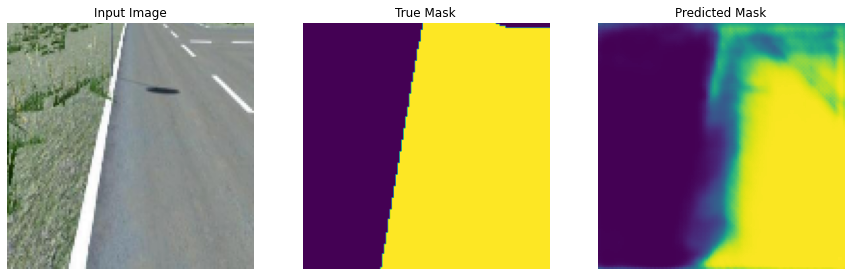


Sample Prediction after epoch 5

80/80 [==============================] - 66s 828ms/step - loss: 0.0498 - binary_accuracy: 0.9806 - val_loss: 0.3017 - val_binary_accuracy: 0.8852
Epoch 6/50
25/80 [========>.....................] - ETA: 45s - loss: 0.0456 - binary_accuracy: 0.9820
Epoch 6: saving model to training_2/cp-0006.ckpt
1/1 [==============================] - 0s 19ms/step


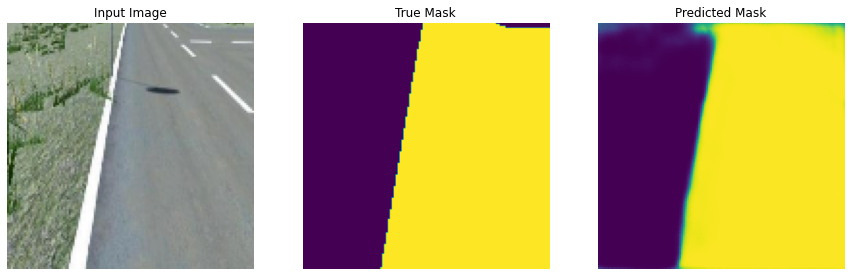


Sample Prediction after epoch 6

80/80 [==============================] - 67s 833ms/step - loss: 0.0421 - binary_accuracy: 0.9835 - val_loss: 0.0765 - val_binary_accuracy: 0.9729
Epoch 7/50
16/80 [=====>........................] - ETA: 51s - loss: 0.0356 - binary_accuracy: 0.9856
Epoch 7: saving model to training_2/cp-0007.ckpt
1/1 [==============================] - 0s 19ms/step


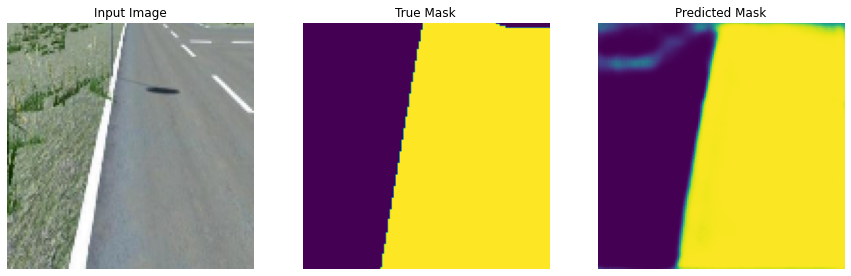


Sample Prediction after epoch 7

80/80 [==============================] - 66s 826ms/step - loss: 0.0362 - binary_accuracy: 0.9856 - val_loss: 0.0582 - val_binary_accuracy: 0.9779
Epoch 8/50
 7/80 [=>............................] - ETA: 58s - loss: 0.0334 - binary_accuracy: 0.9864
Epoch 8: saving model to training_2/cp-0008.ckpt
78/80 [============================>.] - ETA: 1s - loss: 0.0329 - binary_accuracy: 0.9868
Epoch 8: saving model to training_2/cp-0008.ckpt
1/1 [==============================] - 0s 21ms/step


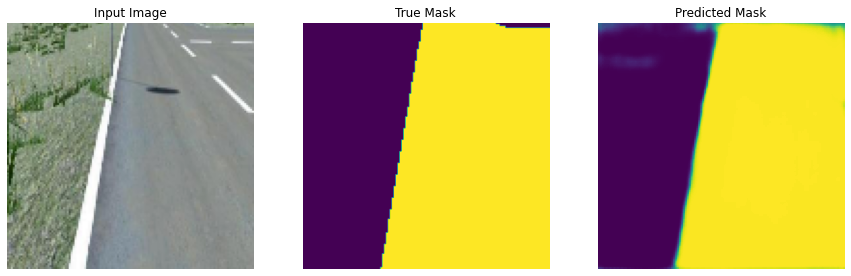


Sample Prediction after epoch 8

80/80 [==============================] - 69s 863ms/step - loss: 0.0328 - binary_accuracy: 0.9868 - val_loss: 0.0472 - val_binary_accuracy: 0.9818
Epoch 9/50
69/80 [========================>.....] - ETA: 8s - loss: 0.0306 - binary_accuracy: 0.9876
Epoch 9: saving model to training_2/cp-0009.ckpt
1/1 [==============================] - 0s 19ms/step


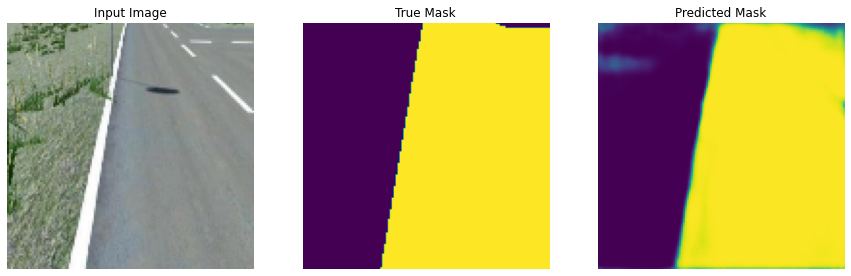


Sample Prediction after epoch 9

80/80 [==============================] - 67s 838ms/step - loss: 0.0305 - binary_accuracy: 0.9877 - val_loss: 0.0382 - val_binary_accuracy: 0.9854
Epoch 10/50
60/80 [=====================>........] - ETA: 16s - loss: 0.0386 - binary_accuracy: 0.9850
Epoch 10: saving model to training_2/cp-0010.ckpt
1/1 [==============================] - 0s 19ms/step


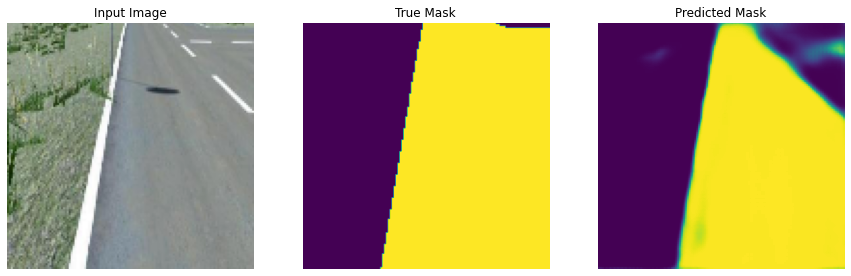


Sample Prediction after epoch 10

80/80 [==============================] - 67s 838ms/step - loss: 0.0363 - binary_accuracy: 0.9858 - val_loss: 0.0430 - val_binary_accuracy: 0.9832
Epoch 11/50
51/80 [==================>...........] - ETA: 23s - loss: 0.0293 - binary_accuracy: 0.9882
Epoch 11: saving model to training_2/cp-0011.ckpt
1/1 [==============================] - 0s 19ms/step


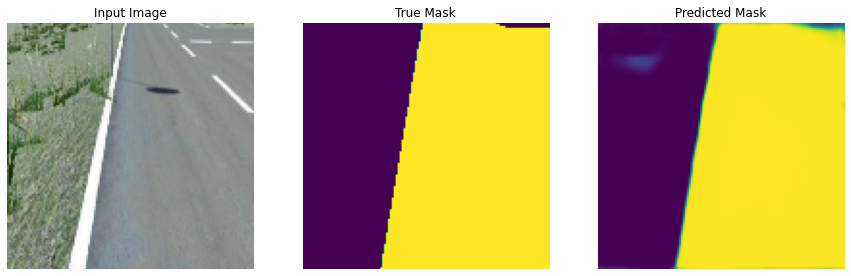


Sample Prediction after epoch 11

80/80 [==============================] - 67s 840ms/step - loss: 0.0285 - binary_accuracy: 0.9885 - val_loss: 0.0316 - val_binary_accuracy: 0.9876
Epoch 12/50
42/80 [==============>...............] - ETA: 31s - loss: 0.0269 - binary_accuracy: 0.9889
Epoch 12: saving model to training_2/cp-0012.ckpt
1/1 [==============================] - 0s 19ms/step


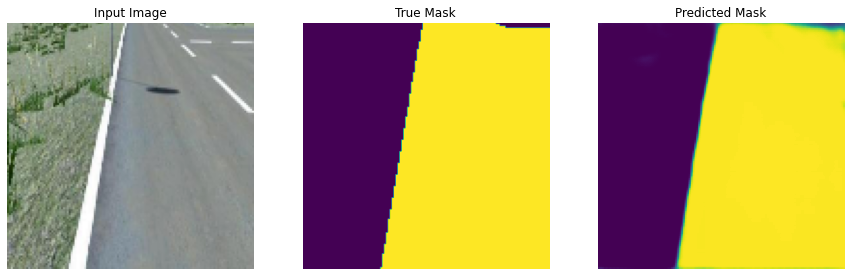


Sample Prediction after epoch 12

80/80 [==============================] - 67s 839ms/step - loss: 0.0263 - binary_accuracy: 0.9892 - val_loss: 0.0272 - val_binary_accuracy: 0.9892
Epoch 13/50
33/80 [===========>..................] - ETA: 38s - loss: 0.0293 - binary_accuracy: 0.9886
Epoch 13: saving model to training_2/cp-0013.ckpt
1/1 [==============================] - 0s 20ms/step


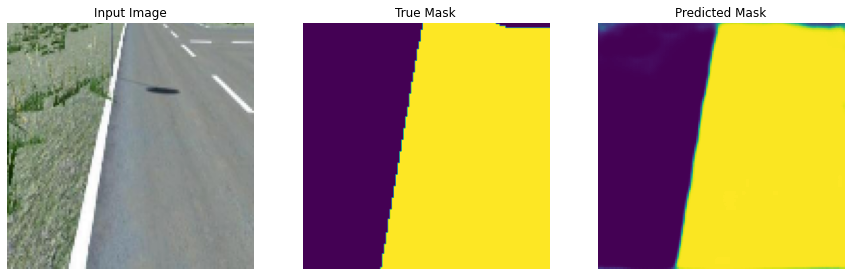


Sample Prediction after epoch 13

80/80 [==============================] - 67s 840ms/step - loss: 0.0283 - binary_accuracy: 0.9889 - val_loss: 0.0287 - val_binary_accuracy: 0.9890
Epoch 14/50
24/80 [========>.....................] - ETA: 45s - loss: 0.0254 - binary_accuracy: 0.9896
Epoch 14: saving model to training_2/cp-0014.ckpt
1/1 [==============================] - 0s 20ms/step


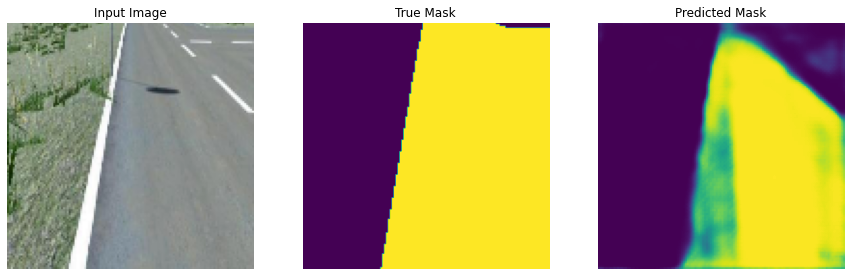


Sample Prediction after epoch 14

80/80 [==============================] - 67s 843ms/step - loss: 0.0295 - binary_accuracy: 0.9882 - val_loss: 0.1163 - val_binary_accuracy: 0.9595
Epoch 15/50
15/80 [====>.........................] - ETA: 53s - loss: 0.0245 - binary_accuracy: 0.9899
Epoch 15: saving model to training_2/cp-0015.ckpt
1/1 [==============================] - 0s 19ms/step


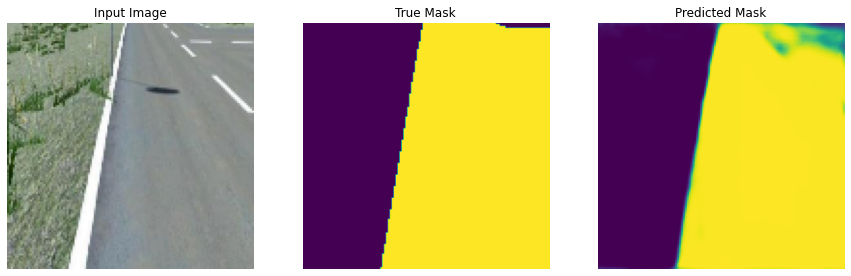


Sample Prediction after epoch 15

80/80 [==============================] - 67s 841ms/step - loss: 0.0260 - binary_accuracy: 0.9895 - val_loss: 0.0304 - val_binary_accuracy: 0.9879
Epoch 16/50
 6/80 [=>............................] - ETA: 1:01 - loss: 0.0233 - binary_accuracy: 0.9903
Epoch 16: saving model to training_2/cp-0016.ckpt
77/80 [===========================>..] - ETA: 2s - loss: 0.0232 - binary_accuracy: 0.9905
Epoch 16: saving model to training_2/cp-0016.ckpt
1/1 [==============================] - 0s 20ms/step


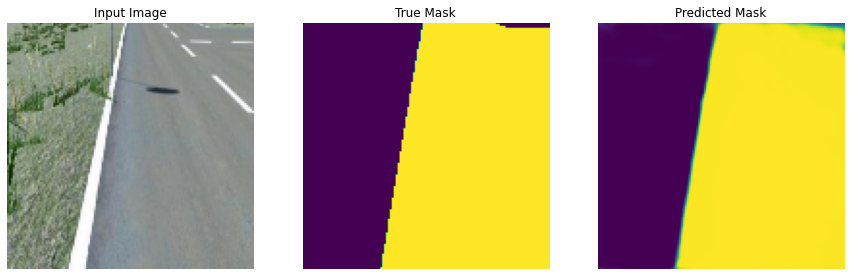


Sample Prediction after epoch 16

80/80 [==============================] - 68s 851ms/step - loss: 0.0231 - binary_accuracy: 0.9905 - val_loss: 0.0236 - val_binary_accuracy: 0.9904
Epoch 17/50
68/80 [========================>.....] - ETA: 9s - loss: 0.0254 - binary_accuracy: 0.9897 
Epoch 17: saving model to training_2/cp-0017.ckpt
1/1 [==============================] - 0s 19ms/step


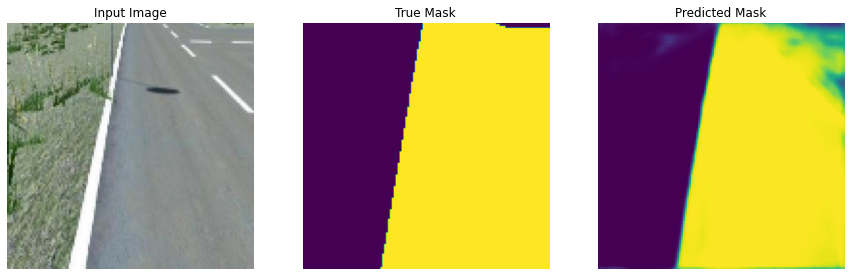


Sample Prediction after epoch 17

80/80 [==============================] - 67s 843ms/step - loss: 0.0252 - binary_accuracy: 0.9897 - val_loss: 0.0607 - val_binary_accuracy: 0.9780
Epoch 18/50
59/80 [=====================>........] - ETA: 17s - loss: 0.0219 - binary_accuracy: 0.9909
Epoch 18: saving model to training_2/cp-0018.ckpt
1/1 [==============================] - 0s 20ms/step


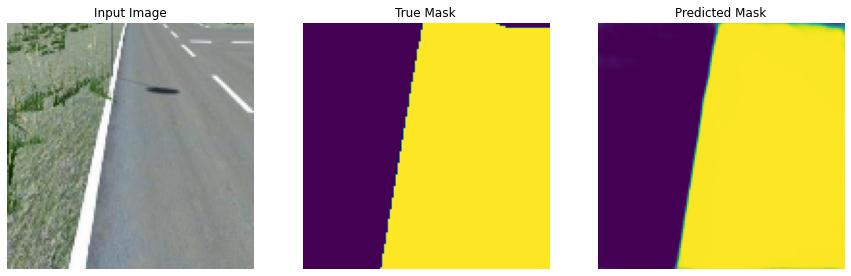


Sample Prediction after epoch 18

80/80 [==============================] - 67s 842ms/step - loss: 0.0215 - binary_accuracy: 0.9911 - val_loss: 0.0236 - val_binary_accuracy: 0.9902
Epoch 19/50
50/80 [=================>............] - ETA: 24s - loss: 0.0203 - binary_accuracy: 0.9916
Epoch 19: saving model to training_2/cp-0019.ckpt
1/1 [==============================] - 0s 20ms/step


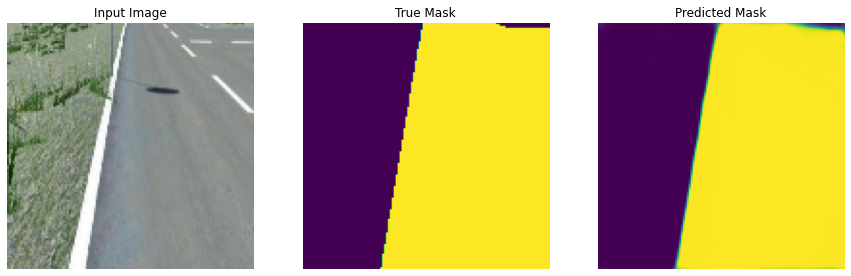


Sample Prediction after epoch 19

80/80 [==============================] - 67s 835ms/step - loss: 0.0200 - binary_accuracy: 0.9916 - val_loss: 0.0209 - val_binary_accuracy: 0.9915
Epoch 20/50
41/80 [==============>...............] - ETA: 32s - loss: 0.0195 - binary_accuracy: 0.9919
Epoch 20: saving model to training_2/cp-0020.ckpt
1/1 [==============================] - 0s 20ms/step


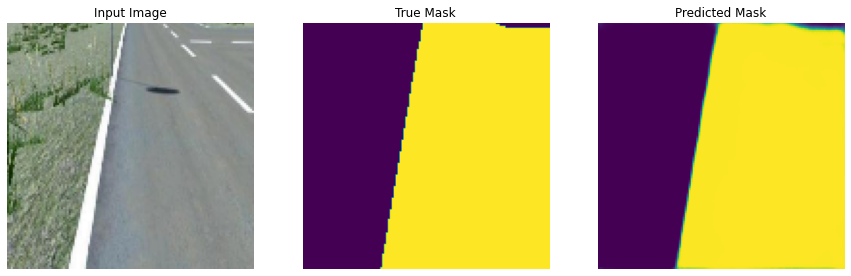


Sample Prediction after epoch 20

80/80 [==============================] - 68s 848ms/step - loss: 0.0192 - binary_accuracy: 0.9919 - val_loss: 0.0214 - val_binary_accuracy: 0.9911
Epoch 21/50
32/80 [===========>..................] - ETA: 39s - loss: 0.0184 - binary_accuracy: 0.9922
Epoch 21: saving model to training_2/cp-0021.ckpt
1/1 [==============================] - 0s 20ms/step


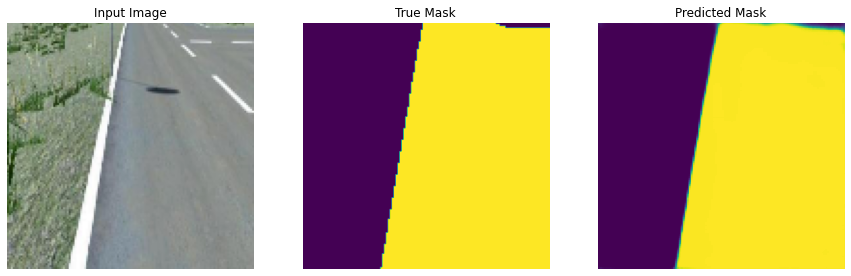


Sample Prediction after epoch 21

80/80 [==============================] - 67s 839ms/step - loss: 0.0185 - binary_accuracy: 0.9922 - val_loss: 0.0210 - val_binary_accuracy: 0.9913
Epoch 22/50
23/80 [=======>......................] - ETA: 46s - loss: 0.0179 - binary_accuracy: 0.9924
Epoch 22: saving model to training_2/cp-0022.ckpt
1/1 [==============================] - 0s 21ms/step


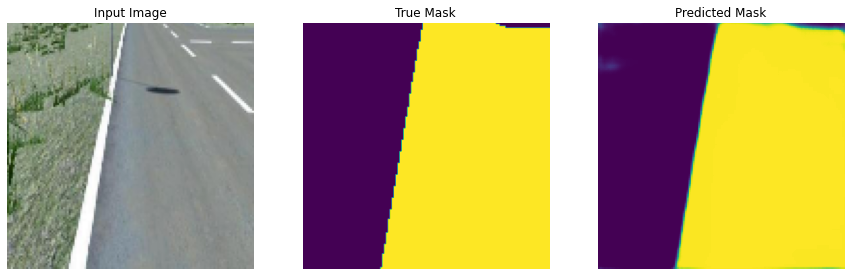


Sample Prediction after epoch 22

80/80 [==============================] - 67s 840ms/step - loss: 0.0180 - binary_accuracy: 0.9924 - val_loss: 0.0202 - val_binary_accuracy: 0.9916
Epoch 23/50
14/80 [====>.........................] - ETA: 54s - loss: 0.0175 - binary_accuracy: 0.9926
Epoch 23: saving model to training_2/cp-0023.ckpt
1/1 [==============================] - 0s 21ms/step


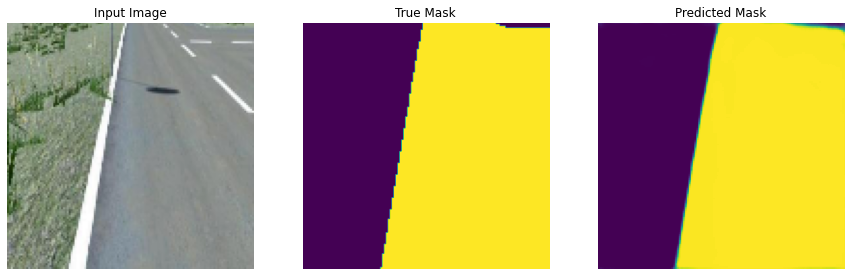


Sample Prediction after epoch 23

80/80 [==============================] - 68s 846ms/step - loss: 0.0178 - binary_accuracy: 0.9925 - val_loss: 0.0194 - val_binary_accuracy: 0.9919
Epoch 24/50
 5/80 [>.............................] - ETA: 1:00 - loss: 0.0169 - binary_accuracy: 0.9928
Epoch 24: saving model to training_2/cp-0024.ckpt
76/80 [===========================>..] - ETA: 3s - loss: 0.0173 - binary_accuracy: 0.9927
Epoch 24: saving model to training_2/cp-0024.ckpt
1/1 [==============================] - 0s 21ms/step


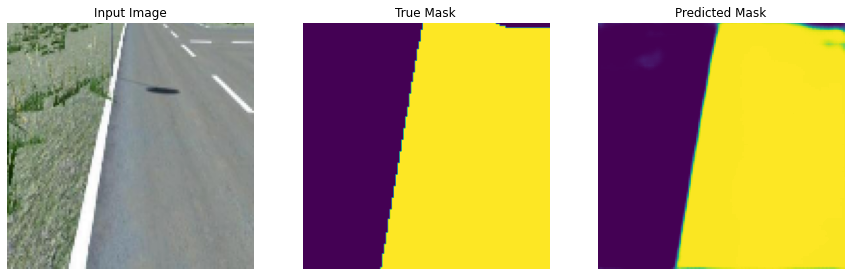


Sample Prediction after epoch 24

80/80 [==============================] - 69s 857ms/step - loss: 0.0173 - binary_accuracy: 0.9927 - val_loss: 0.0194 - val_binary_accuracy: 0.9921
Epoch 25/50
67/80 [========================>.....] - ETA: 10s - loss: 0.0170 - binary_accuracy: 0.9928
Epoch 25: saving model to training_2/cp-0025.ckpt
1/1 [==============================] - 0s 20ms/step


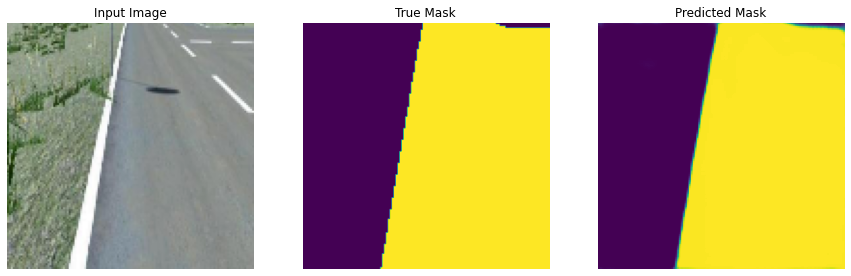


Sample Prediction after epoch 25

80/80 [==============================] - 67s 841ms/step - loss: 0.0169 - binary_accuracy: 0.9928 - val_loss: 0.0175 - val_binary_accuracy: 0.9926
Epoch 26/50
58/80 [====================>.........] - ETA: 18s - loss: 0.0163 - binary_accuracy: 0.9931
Epoch 26: saving model to training_2/cp-0026.ckpt
1/1 [==============================] - 0s 20ms/step


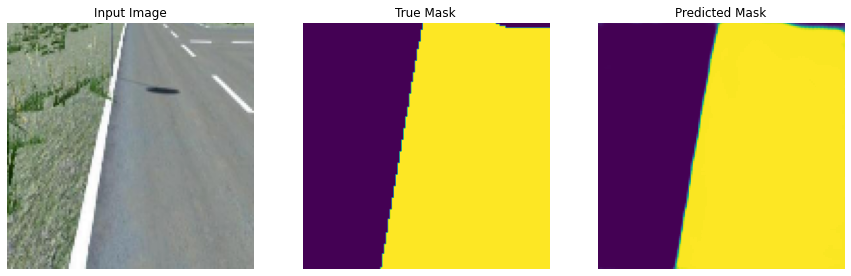


Sample Prediction after epoch 26

80/80 [==============================] - 68s 850ms/step - loss: 0.0162 - binary_accuracy: 0.9931 - val_loss: 0.0171 - val_binary_accuracy: 0.9930
Epoch 27/50
49/80 [=================>............] - ETA: 25s - loss: 0.0159 - binary_accuracy: 0.9933
Epoch 27: saving model to training_2/cp-0027.ckpt
1/1 [==============================] - 0s 26ms/step


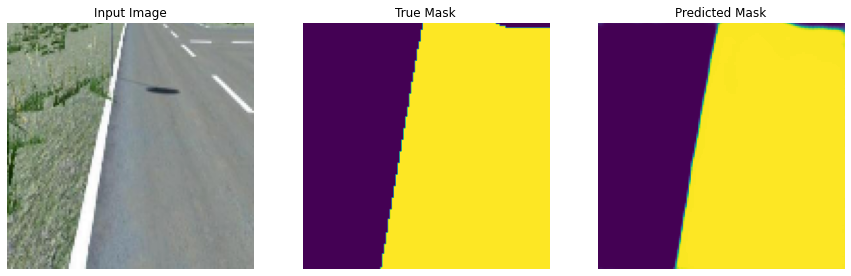


Sample Prediction after epoch 27

80/80 [==============================] - 67s 833ms/step - loss: 0.0159 - binary_accuracy: 0.9933 - val_loss: 0.0196 - val_binary_accuracy: 0.9922
Epoch 28/50
40/80 [==============>...............] - ETA: 32s - loss: 0.0157 - binary_accuracy: 0.9934
Epoch 28: saving model to training_2/cp-0028.ckpt
1/1 [==============================] - 0s 20ms/step


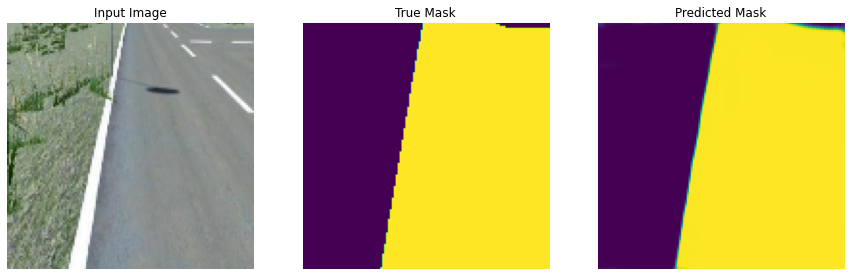


Sample Prediction after epoch 28

80/80 [==============================] - 67s 834ms/step - loss: 0.0163 - binary_accuracy: 0.9931 - val_loss: 0.0190 - val_binary_accuracy: 0.9920
Epoch 29/50
31/80 [==========>...................] - ETA: 40s - loss: 0.0154 - binary_accuracy: 0.9934
Epoch 29: saving model to training_2/cp-0029.ckpt
1/1 [==============================] - 0s 22ms/step


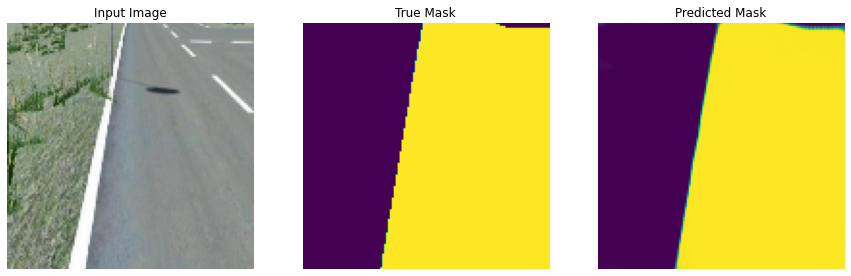


Sample Prediction after epoch 29

80/80 [==============================] - 68s 847ms/step - loss: 0.0153 - binary_accuracy: 0.9935 - val_loss: 0.0173 - val_binary_accuracy: 0.9930
Epoch 30/50
22/80 [=======>......................] - ETA: 47s - loss: 0.0152 - binary_accuracy: 0.9935
Epoch 30: saving model to training_2/cp-0030.ckpt
1/1 [==============================] - 0s 20ms/step


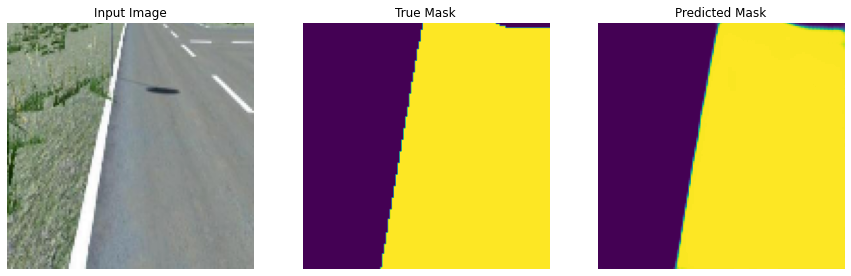


Sample Prediction after epoch 30

80/80 [==============================] - 68s 844ms/step - loss: 0.0151 - binary_accuracy: 0.9936 - val_loss: 0.0166 - val_binary_accuracy: 0.9931
Epoch 31/50
13/80 [===>..........................] - ETA: 55s - loss: 0.0148 - binary_accuracy: 0.9937
Epoch 31: saving model to training_2/cp-0031.ckpt
1/1 [==============================] - 0s 20ms/step


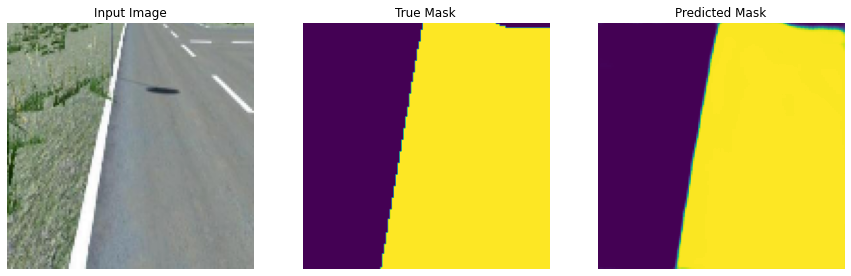


Sample Prediction after epoch 31

80/80 [==============================] - 68s 846ms/step - loss: 0.0152 - binary_accuracy: 0.9936 - val_loss: 0.0199 - val_binary_accuracy: 0.9919
Epoch 32/50
 4/80 [>.............................] - ETA: 1:02 - loss: 0.0145 - binary_accuracy: 0.9939
Epoch 32: saving model to training_2/cp-0032.ckpt
75/80 [===========================>..] - ETA: 4s - loss: 0.0154 - binary_accuracy: 0.9936
Epoch 32: saving model to training_2/cp-0032.ckpt
1/1 [==============================] - 0s 20ms/step


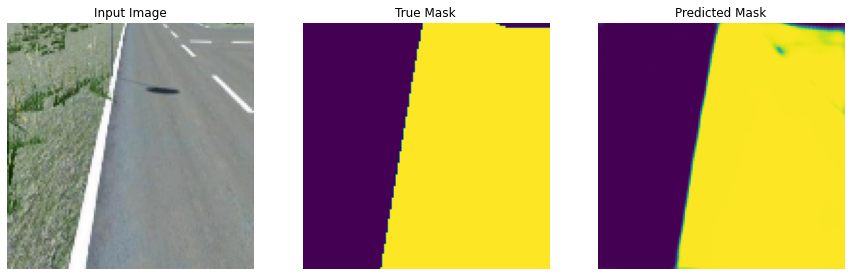


Sample Prediction after epoch 32

80/80 [==============================] - 68s 850ms/step - loss: 0.0155 - binary_accuracy: 0.9936 - val_loss: 0.0200 - val_binary_accuracy: 0.9920
Epoch 33/50
66/80 [=======================>......] - ETA: 11s - loss: 0.0155 - binary_accuracy: 0.9935
Epoch 33: saving model to training_2/cp-0033.ckpt
1/1 [==============================] - 0s 24ms/step


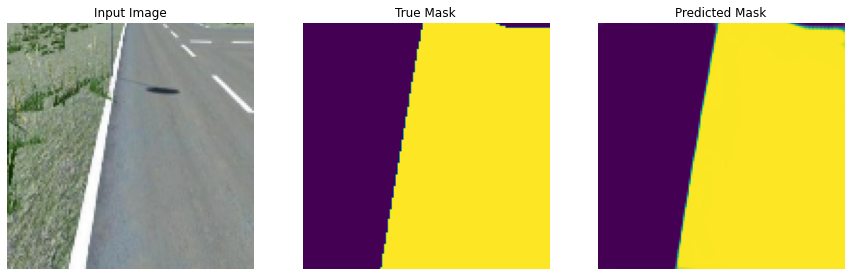


Sample Prediction after epoch 33

80/80 [==============================] - 68s 849ms/step - loss: 0.0153 - binary_accuracy: 0.9936 - val_loss: 0.0162 - val_binary_accuracy: 0.9934
Epoch 34/50
57/80 [====================>.........] - ETA: 18s - loss: 0.0142 - binary_accuracy: 0.9940
Epoch 34: saving model to training_2/cp-0034.ckpt
1/1 [==============================] - 0s 24ms/step


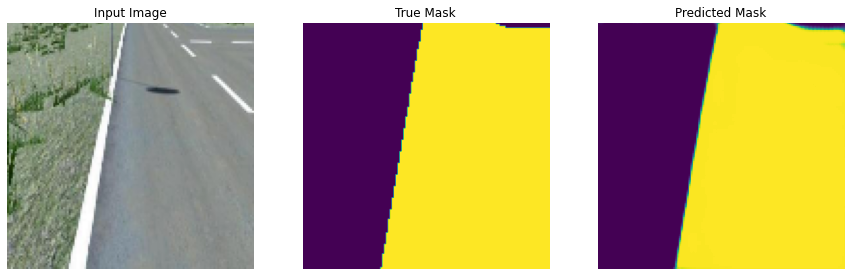


Sample Prediction after epoch 34

80/80 [==============================] - 67s 843ms/step - loss: 0.0141 - binary_accuracy: 0.9941 - val_loss: 0.0164 - val_binary_accuracy: 0.9935
Epoch 35/50
48/80 [=================>............] - ETA: 26s - loss: 0.0136 - binary_accuracy: 0.9942
Epoch 35: saving model to training_2/cp-0035.ckpt
1/1 [==============================] - 0s 20ms/step


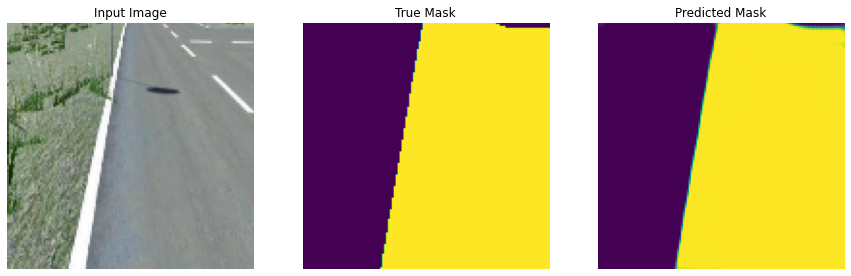


Sample Prediction after epoch 35

80/80 [==============================] - 67s 840ms/step - loss: 0.0136 - binary_accuracy: 0.9943 - val_loss: 0.0164 - val_binary_accuracy: 0.9935
Epoch 36/50
39/80 [=============>................] - ETA: 33s - loss: 0.0131 - binary_accuracy: 0.9945
Epoch 36: saving model to training_2/cp-0036.ckpt
1/1 [==============================] - 0s 22ms/step


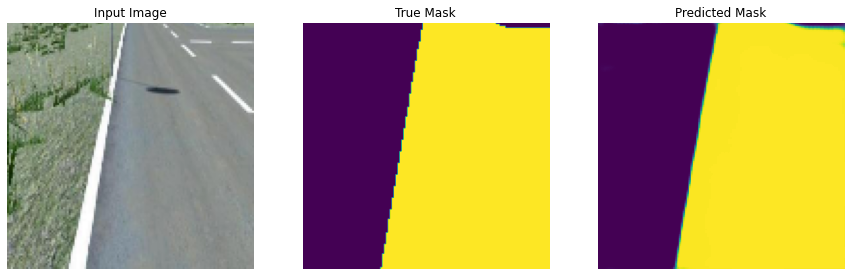


Sample Prediction after epoch 36

80/80 [==============================] - 67s 835ms/step - loss: 0.0133 - binary_accuracy: 0.9944 - val_loss: 0.0165 - val_binary_accuracy: 0.9933
Epoch 37/50
30/80 [==========>...................] - ETA: 41s - loss: 0.0133 - binary_accuracy: 0.9944
Epoch 37: saving model to training_2/cp-0037.ckpt
1/1 [==============================] - 0s 20ms/step


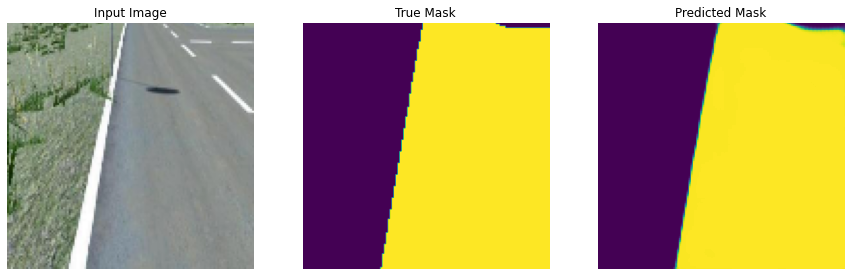


Sample Prediction after epoch 37

80/80 [==============================] - 68s 855ms/step - loss: 0.0131 - binary_accuracy: 0.9945 - val_loss: 0.0169 - val_binary_accuracy: 0.9935
Epoch 38/50
21/80 [======>.......................] - ETA: 48s - loss: 0.0130 - binary_accuracy: 0.9945
Epoch 38: saving model to training_2/cp-0038.ckpt
1/1 [==============================] - 0s 19ms/step


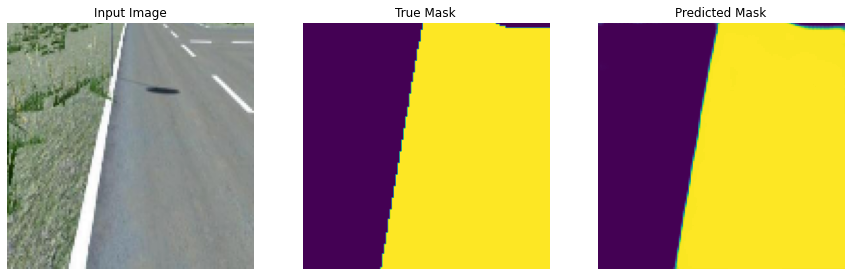


Sample Prediction after epoch 38

80/80 [==============================] - 68s 851ms/step - loss: 0.0127 - binary_accuracy: 0.9946 - val_loss: 0.0155 - val_binary_accuracy: 0.9936
Epoch 39/50
12/80 [===>..........................] - ETA: 56s - loss: 0.0125 - binary_accuracy: 0.9947
Epoch 39: saving model to training_2/cp-0039.ckpt
1/1 [==============================] - 0s 24ms/step


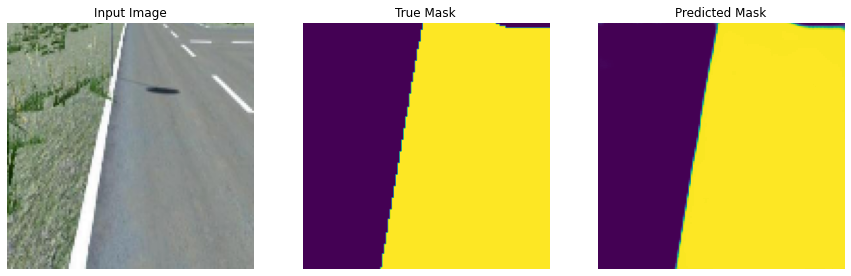


Sample Prediction after epoch 39

80/80 [==============================] - 68s 849ms/step - loss: 0.0124 - binary_accuracy: 0.9947 - val_loss: 0.0157 - val_binary_accuracy: 0.9941
Epoch 40/50
 3/80 [>.............................] - ETA: 1:03 - loss: 0.0123 - binary_accuracy: 0.9948
Epoch 40: saving model to training_2/cp-0040.ckpt
74/80 [==========================>...] - ETA: 5s - loss: 0.0144 - binary_accuracy: 0.9940
Epoch 40: saving model to training_2/cp-0040.ckpt
1/1 [==============================] - 0s 19ms/step


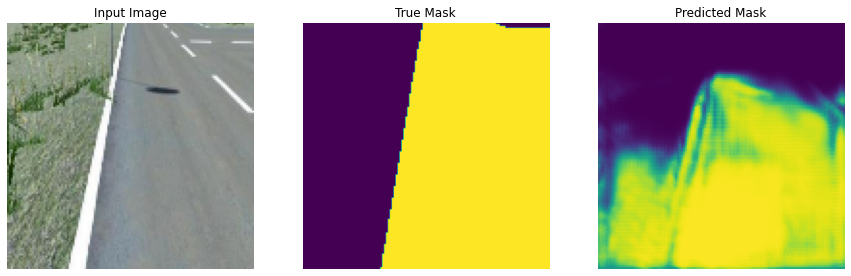


Sample Prediction after epoch 40

80/80 [==============================] - 69s 865ms/step - loss: 0.0171 - binary_accuracy: 0.9931 - val_loss: 0.3375 - val_binary_accuracy: 0.8759
Epoch 41/50
65/80 [=======================>......] - ETA: 12s - loss: 0.0446 - binary_accuracy: 0.9840
Epoch 41: saving model to training_2/cp-0041.ckpt
1/1 [==============================] - 0s 20ms/step


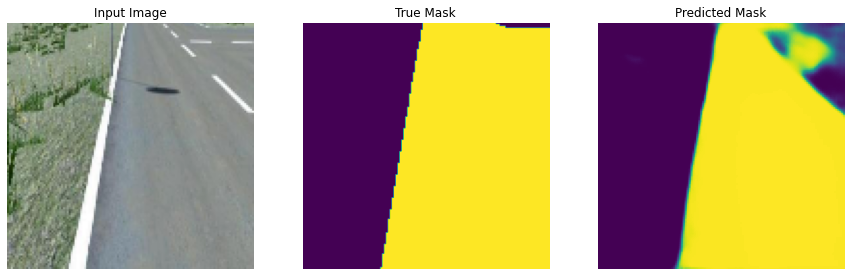


Sample Prediction after epoch 41

80/80 [==============================] - 68s 845ms/step - loss: 0.0405 - binary_accuracy: 0.9853 - val_loss: 0.0379 - val_binary_accuracy: 0.9860
Epoch 42/50
56/80 [====================>.........] - ETA: 19s - loss: 0.0234 - binary_accuracy: 0.9910
Epoch 42: saving model to training_2/cp-0042.ckpt
1/1 [==============================] - 0s 19ms/step


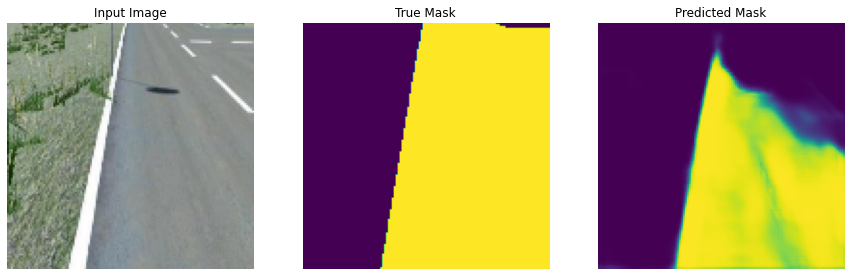


Sample Prediction after epoch 42

80/80 [==============================] - 67s 838ms/step - loss: 0.0239 - binary_accuracy: 0.9908 - val_loss: 0.0435 - val_binary_accuracy: 0.9846
Epoch 43/50
47/80 [================>.............] - ETA: 27s - loss: 0.0197 - binary_accuracy: 0.9920
Epoch 43: saving model to training_2/cp-0043.ckpt
1/1 [==============================] - 0s 25ms/step


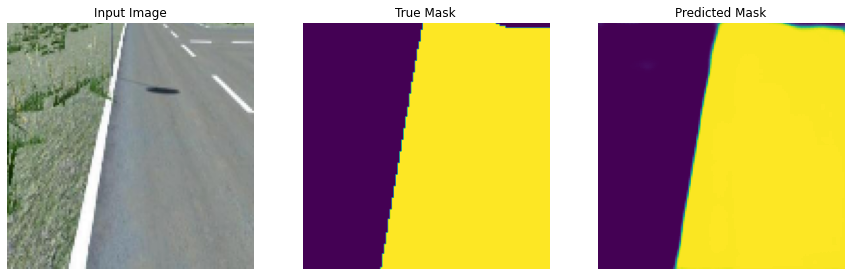


Sample Prediction after epoch 43

80/80 [==============================] - 68s 847ms/step - loss: 0.0183 - binary_accuracy: 0.9925 - val_loss: 0.0190 - val_binary_accuracy: 0.9925
Epoch 44/50
38/80 [=============>................] - ETA: 34s - loss: 0.0154 - binary_accuracy: 0.9936
Epoch 44: saving model to training_2/cp-0044.ckpt
1/1 [==============================] - 0s 20ms/step


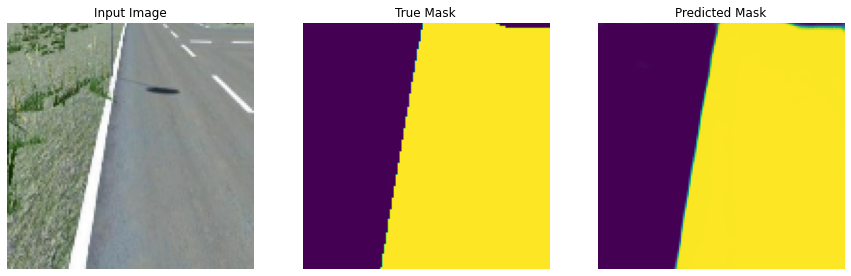


Sample Prediction after epoch 44

80/80 [==============================] - 67s 842ms/step - loss: 0.0155 - binary_accuracy: 0.9936 - val_loss: 0.0163 - val_binary_accuracy: 0.9935
Epoch 45/50
29/80 [=========>....................] - ETA: 41s - loss: 0.0149 - binary_accuracy: 0.9938
Epoch 45: saving model to training_2/cp-0045.ckpt
1/1 [==============================] - 0s 23ms/step


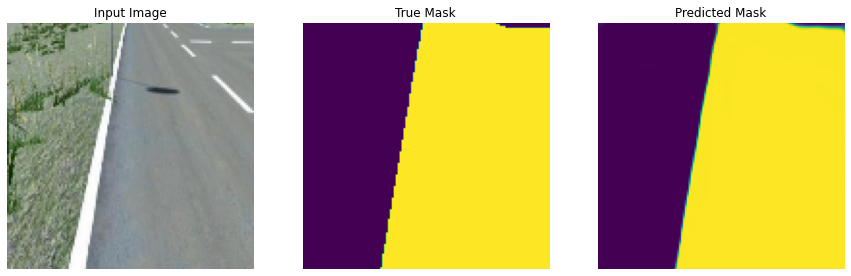


Sample Prediction after epoch 45

80/80 [==============================] - 67s 838ms/step - loss: 0.0144 - binary_accuracy: 0.9939 - val_loss: 0.0174 - val_binary_accuracy: 0.9929
Epoch 46/50
20/80 [======>.......................] - ETA: 49s - loss: 0.0137 - binary_accuracy: 0.9942
Epoch 46: saving model to training_2/cp-0046.ckpt
1/1 [==============================] - 0s 20ms/step


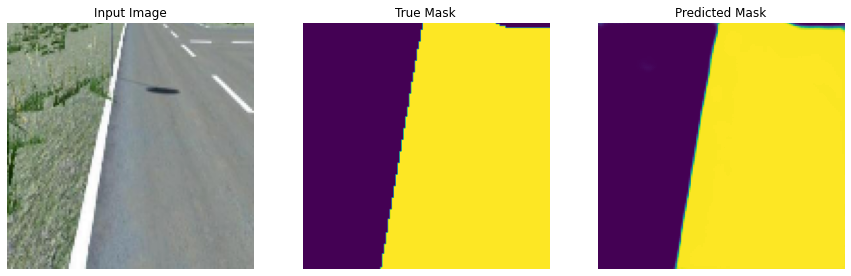


Sample Prediction after epoch 46

80/80 [==============================] - 68s 848ms/step - loss: 0.0141 - binary_accuracy: 0.9941 - val_loss: 0.0172 - val_binary_accuracy: 0.9931
Epoch 47/50
11/80 [===>..........................] - ETA: 57s - loss: 0.0138 - binary_accuracy: 0.9942
Epoch 47: saving model to training_2/cp-0047.ckpt
1/1 [==============================] - 0s 19ms/step


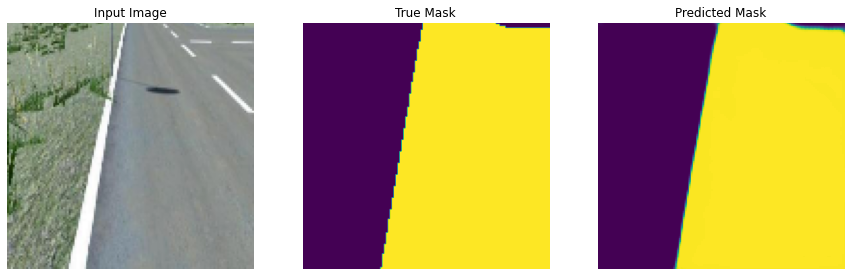


Sample Prediction after epoch 47

80/80 [==============================] - 69s 857ms/step - loss: 0.0135 - binary_accuracy: 0.9943 - val_loss: 0.0177 - val_binary_accuracy: 0.9931
Epoch 48/50
 2/80 [..............................] - ETA: 1:04 - loss: 0.0129 - binary_accuracy: 0.9945
Epoch 48: saving model to training_2/cp-0048.ckpt
73/80 [==========================>...] - ETA: 5s - loss: 0.0130 - binary_accuracy: 0.9946
Epoch 48: saving model to training_2/cp-0048.ckpt
1/1 [==============================] - 0s 20ms/step


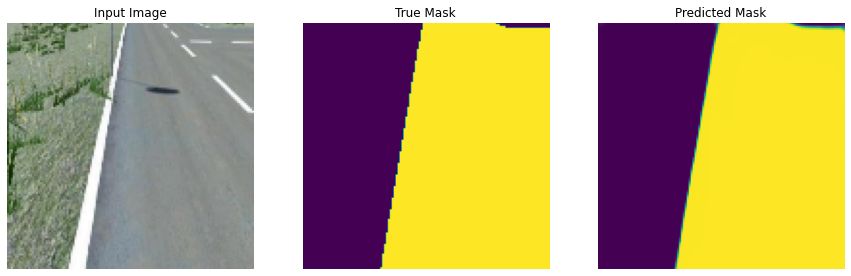


Sample Prediction after epoch 48

80/80 [==============================] - 68s 855ms/step - loss: 0.0130 - binary_accuracy: 0.9946 - val_loss: 0.0188 - val_binary_accuracy: 0.9929
Epoch 49/50
64/80 [=======================>......] - ETA: 13s - loss: 0.0127 - binary_accuracy: 0.9947
Epoch 49: saving model to training_2/cp-0049.ckpt
1/1 [==============================] - 0s 19ms/step


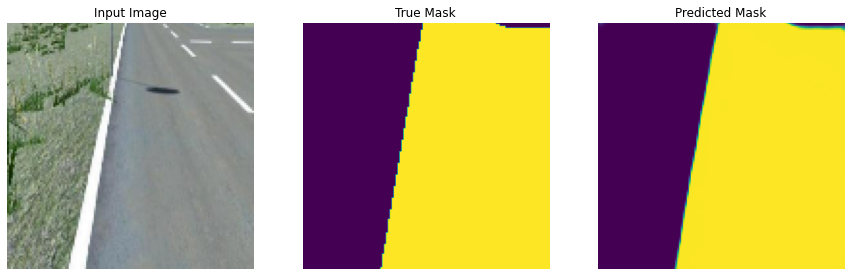


Sample Prediction after epoch 49

80/80 [==============================] - 68s 845ms/step - loss: 0.0126 - binary_accuracy: 0.9947 - val_loss: 0.0155 - val_binary_accuracy: 0.9937
Epoch 50/50
55/80 [===================>..........] - ETA: 20s - loss: 0.0123 - binary_accuracy: 0.9948
Epoch 50: saving model to training_2/cp-0050.ckpt
1/1 [==============================] - 0s 23ms/step


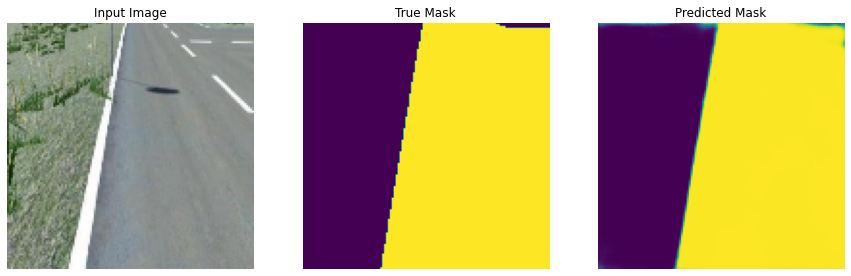


Sample Prediction after epoch 50

80/80 [==============================] - 67s 841ms/step - loss: 0.0137 - binary_accuracy: 0.9943 - val_loss: 0.0223 - val_binary_accuracy: 0.9916
Epoch 1/50
46/80 [================>.............] - ETA: 28s - loss: 0.0143 - binary_accuracy: 0.9941
Epoch 1: saving model to training_2/cp-0001.ckpt
1/1 [==============================] - 0s 19ms/step


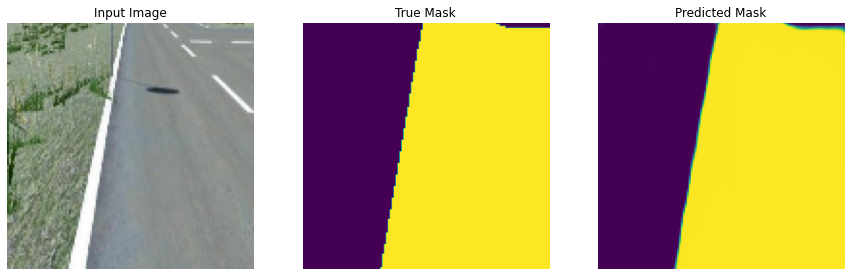


Sample Prediction after epoch 1

80/80 [==============================] - 68s 846ms/step - loss: 0.0142 - binary_accuracy: 0.9941 - val_loss: 0.0176 - val_binary_accuracy: 0.9931
Epoch 2/50
37/80 [============>.................] - ETA: 35s - loss: 0.0130 - binary_accuracy: 0.9946
Epoch 2: saving model to training_2/cp-0002.ckpt
1/1 [==============================] - 0s 19ms/step


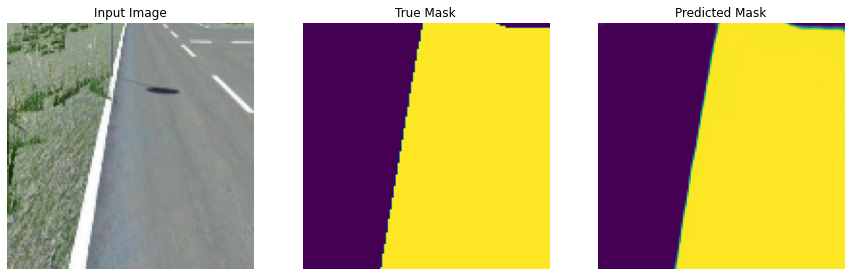


Sample Prediction after epoch 2

80/80 [==============================] - 68s 844ms/step - loss: 0.0126 - binary_accuracy: 0.9948 - val_loss: 0.0159 - val_binary_accuracy: 0.9937
Epoch 3/50
28/80 [=========>....................] - ETA: 42s - loss: 0.0118 - binary_accuracy: 0.9950
Epoch 3: saving model to training_2/cp-0003.ckpt
1/1 [==============================] - 0s 19ms/step


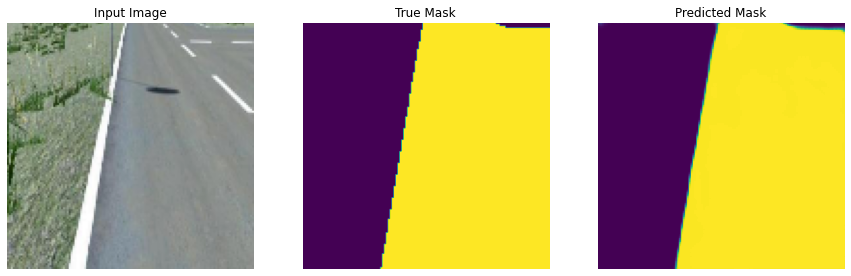


Sample Prediction after epoch 3

80/80 [==============================] - 68s 845ms/step - loss: 0.0124 - binary_accuracy: 0.9949 - val_loss: 0.0143 - val_binary_accuracy: 0.9942
Epoch 4/50
19/80 [======>.......................] - ETA: 50s - loss: 0.0117 - binary_accuracy: 0.9951
Epoch 4: saving model to training_2/cp-0004.ckpt
1/1 [==============================] - 0s 20ms/step


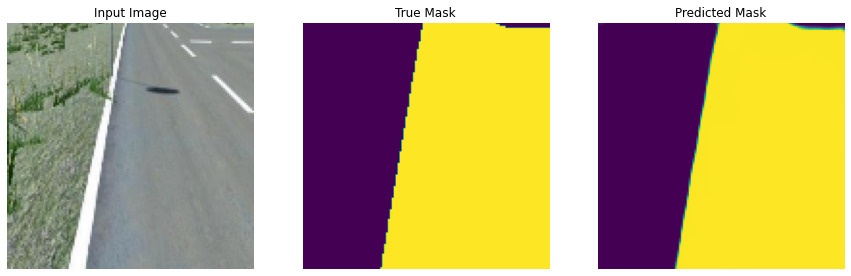


Sample Prediction after epoch 4

80/80 [==============================] - 68s 848ms/step - loss: 0.0118 - binary_accuracy: 0.9951 - val_loss: 0.0160 - val_binary_accuracy: 0.9939
Epoch 5/50
10/80 [==>...........................] - ETA: 57s - loss: 0.0111 - binary_accuracy: 0.9954
Epoch 5: saving model to training_2/cp-0005.ckpt
1/1 [==============================] - 0s 19ms/step


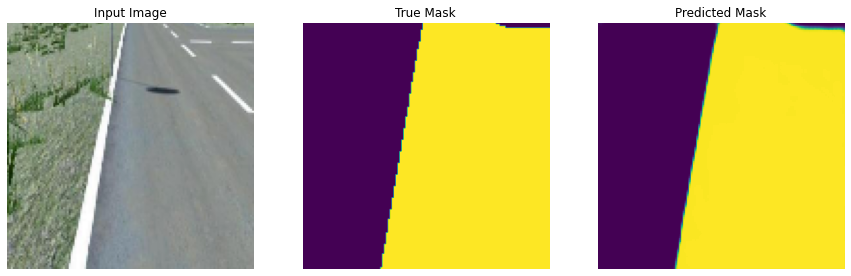


Sample Prediction after epoch 5

80/80 [==============================] - 68s 850ms/step - loss: 0.0113 - binary_accuracy: 0.9953 - val_loss: 0.0133 - val_binary_accuracy: 0.9945
Epoch 6/50
 1/80 [..............................] - ETA: 1:12 - loss: 0.0108 - binary_accuracy: 0.9954
Epoch 6: saving model to training_2/cp-0006.ckpt
72/80 [==========================>...] - ETA: 6s - loss: 0.0117 - binary_accuracy: 0.9951
Epoch 6: saving model to training_2/cp-0006.ckpt
1/1 [==============================] - 0s 20ms/step


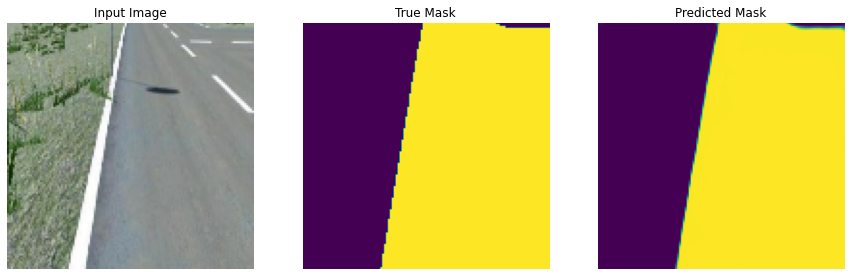


Sample Prediction after epoch 6

80/80 [==============================] - 69s 859ms/step - loss: 0.0117 - binary_accuracy: 0.9951 - val_loss: 0.0158 - val_binary_accuracy: 0.9940
Epoch 7/50
54/80 [===================>..........] - ETA: 21s - loss: 0.0120 - binary_accuracy: 0.9952

KeyboardInterrupt: ignored

In [ ]:
# traing and show the result
import os

EPOCHS = 50
STEPS_PER_EPOCH = train_size // batch_size+1
VALIDATION_STEPS = val_size // batch_size
checkpoint_path = "training_2/cp-{epoch:04d}.ckpt"
checkpoint_dir = os.path.dirname(checkpoint_path)


# Create a callback that saves the model's weights every 5 epochs
cp_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_path, 
    verbose=1, 
    save_weights_only=True,
    save_freq=71)
model.save_weights(checkpoint_path.format(epoch=0))
for i in range(500):
  model_history = model.fit(train_ds, epochs=EPOCHS,
                            steps_per_epoch=STEPS_PER_EPOCH,
                            validation_steps=VALIDATION_STEPS,
                            validation_data=val_ds,
                            callbacks=[DisplayCallback(),
                                       cp_callback])
  model.save('/content/gdrive/MyDrive/laneDetection/Lane.h5')

In [ ]:
os.listdir(checkpoint_dir)

['cp-0044.ckpt.index',
 'cp-0021.ckpt.data-00000-of-00001',
 'cp-0003.ckpt.index',
 'cp-0040.ckpt.data-00000-of-00001',
 'cp-0023.ckpt.index',
 'cp-0031.ckpt.index',
 'cp-0001.ckpt.index',
 'cp-0045.ckpt.data-00000-of-00001',
 'cp-0021.ckpt.index',
 'cp-0004.ckpt.data-00000-of-00001',
 'cp-0039.ckpt.index',
 'cp-0006.ckpt.data-00000-of-00001',
 'cp-0036.ckpt.data-00000-of-00001',
 'cp-0022.ckpt.index',
 'cp-0049.ckpt.index',
 'cp-0041.ckpt.index',
 'cp-0032.ckpt.data-00000-of-00001',
 'cp-0043.ckpt.index',
 'cp-0039.ckpt.data-00000-of-00001',
 'cp-0050.ckpt.index',
 'cp-0010.ckpt.index',
 'cp-0003.ckpt.data-00000-of-00001',
 'cp-0024.ckpt.index',
 'cp-0000.ckpt.index',
 'cp-0032.ckpt.index',
 'cp-0001.ckpt.data-00000-of-00001',
 'cp-0046.ckpt.index',
 'cp-0006.ckpt.index',
 'cp-0023.ckpt.data-00000-of-00001',
 'cp-0048.ckpt.index',
 'cp-0034.ckpt.index',
 'cp-0041.ckpt.data-00000-of-00001',
 'cp-0005.ckpt.data-00000-of-00001',
 'cp-0007.ckpt.index',
 'cp-0025.ckpt.index',
 'cp-0008.ckp

In [ ]:
latest = tf.train.latest_checkpoint(checkpoint_dir)
latest

'training_2/cp-0006.ckpt'

In [ ]:
model.load_weights(latest)

In [ ]:
 model.save('/content/gdrive/MyDrive/laneDetection/Lane.h5')

In [ ]:
model = tf.keras.models.load_model('/content/gdrive/MyDrive/laneDetection/Lane.h5')

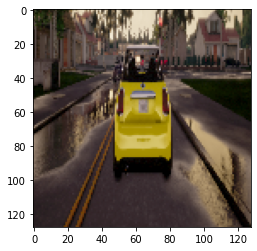

2/2 [==============================] - 0s 158ms/step


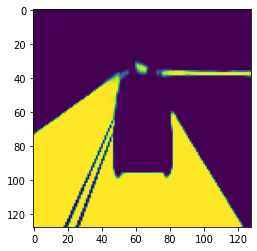

In [ ]:
for images,labels in val_ds.take(1):
  # print(images.shape)
  plt.imshow(images[0])
  plt.show()
  a = model.predict(images)
  # print(a)

  # a=a 
  a= a[0].reshape(128,128)
  plt.imshow(a)  
  # lista = np.unique(a.numpy())
  # # print(lista)
  
  # # labels.set_shape((128,128))
  # plt.imshow(tf.keras.utils.array_to_img(labels[0]))
  # plt.show()



In [ ]:
os.mkdir('Test_Folder')

(128, 128, 3)
1/1 [==============================] - 0s 20ms/step
<class 'numpy.ndarray'>


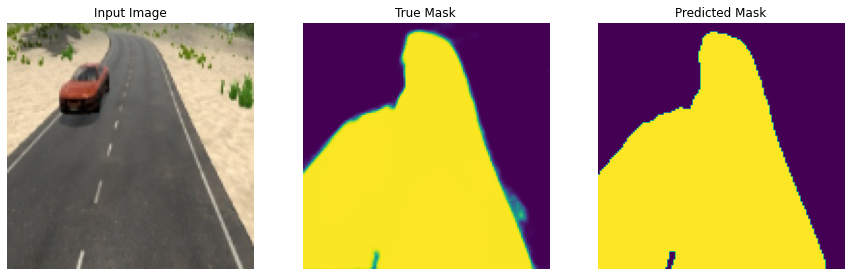

(128, 128, 3)
1/1 [==============================] - 0s 20ms/step
<class 'numpy.ndarray'>


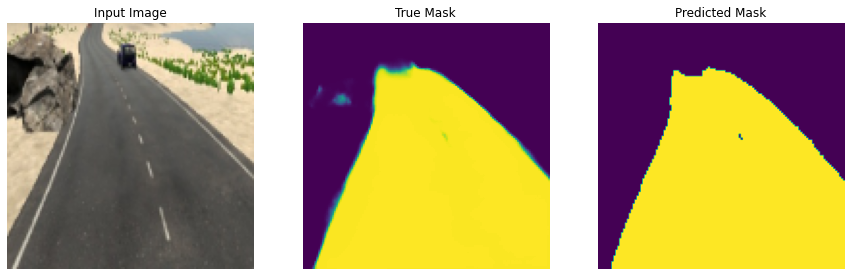

(128, 128, 3)
1/1 [==============================] - 0s 19ms/step
<class 'numpy.ndarray'>


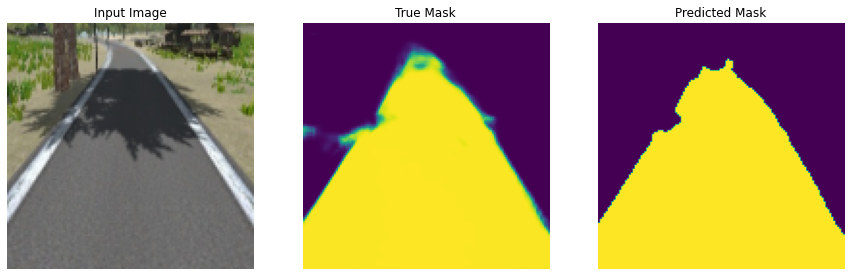

(128, 128, 3)
1/1 [==============================] - 0s 21ms/step
<class 'numpy.ndarray'>


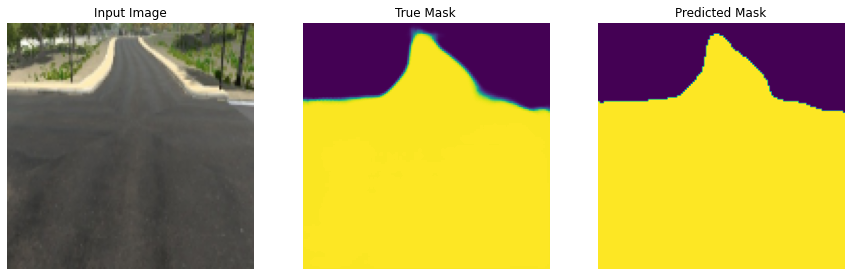

(128, 128, 3)
1/1 [==============================] - 0s 20ms/step
<class 'numpy.ndarray'>


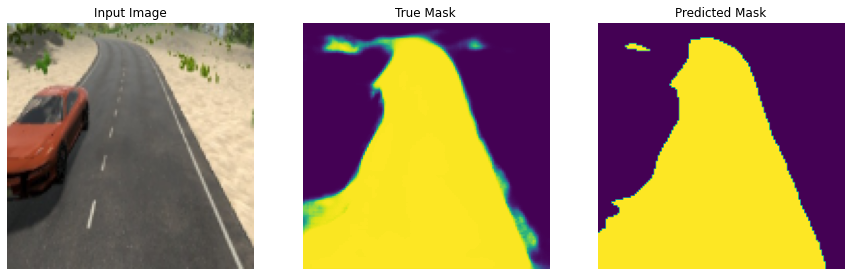

(128, 128, 3)
1/1 [==============================] - 0s 20ms/step
<class 'numpy.ndarray'>


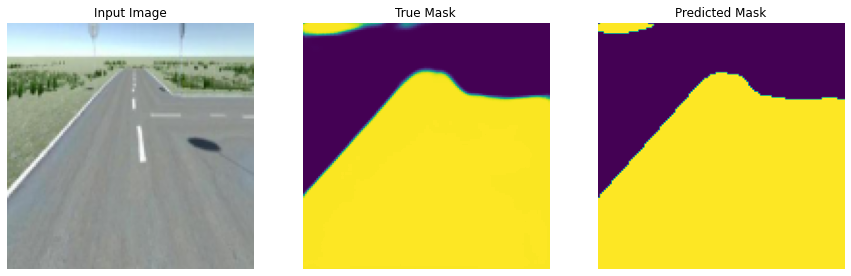

(128, 128, 3)
1/1 [==============================] - 0s 24ms/step
<class 'numpy.ndarray'>


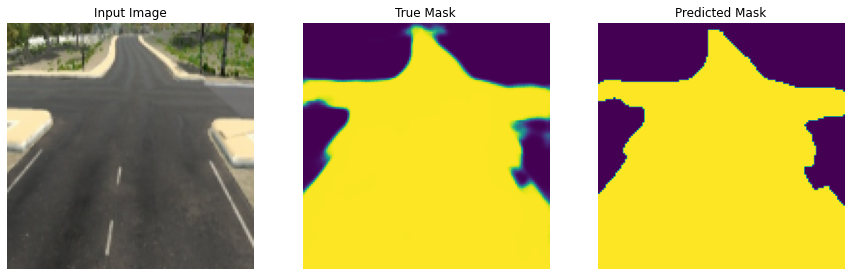

(128, 128, 3)
1/1 [==============================] - 0s 21ms/step
<class 'numpy.ndarray'>


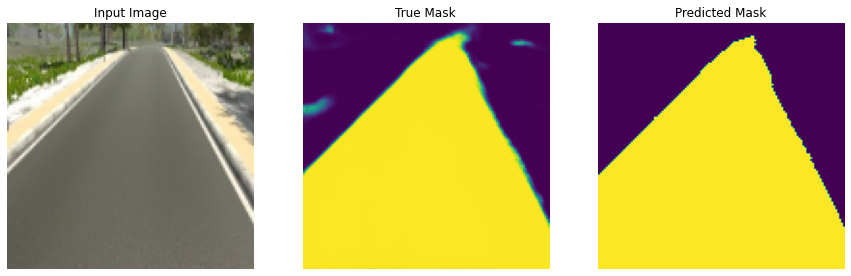

(128, 128, 3)
1/1 [==============================] - 0s 22ms/step
<class 'numpy.ndarray'>


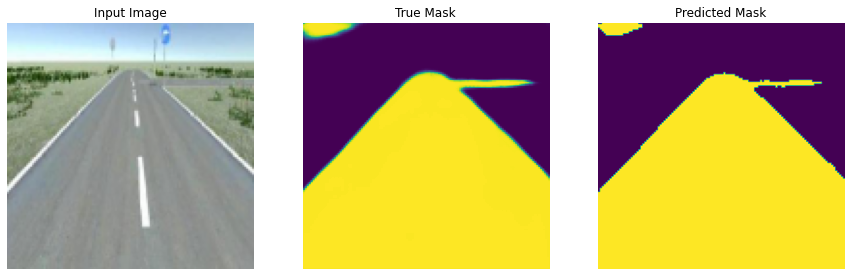

(128, 128, 3)
1/1 [==============================] - 0s 31ms/step
<class 'numpy.ndarray'>


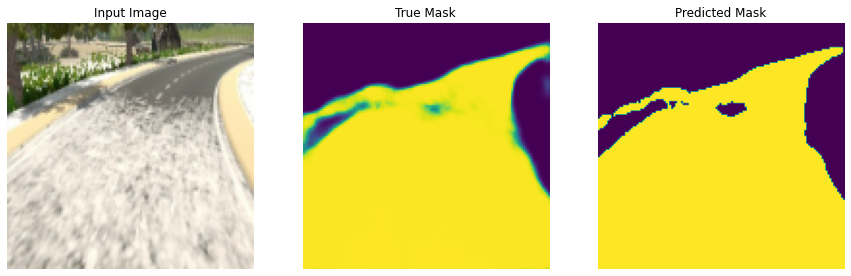

(128, 128, 3)
1/1 [==============================] - 0s 27ms/step
<class 'numpy.ndarray'>


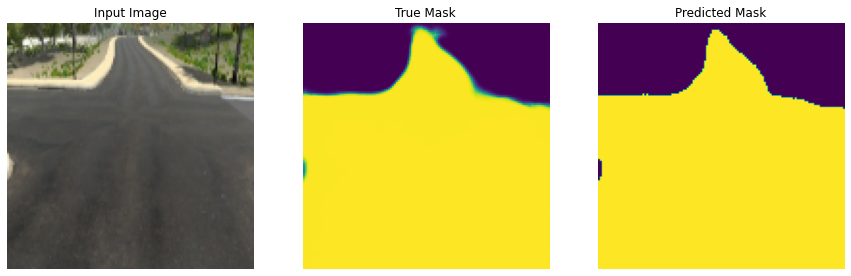

(128, 128, 3)
1/1 [==============================] - 0s 29ms/step
<class 'numpy.ndarray'>


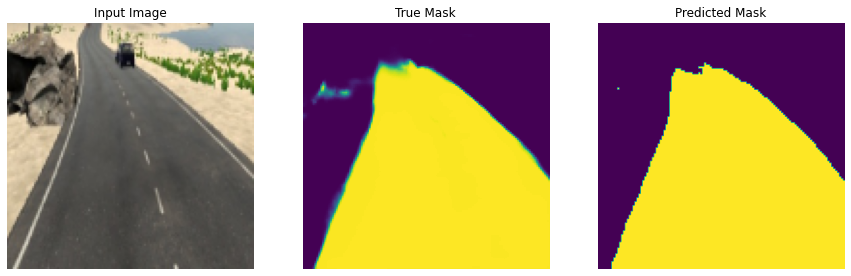

(128, 128, 3)
1/1 [==============================] - 0s 20ms/step
<class 'numpy.ndarray'>


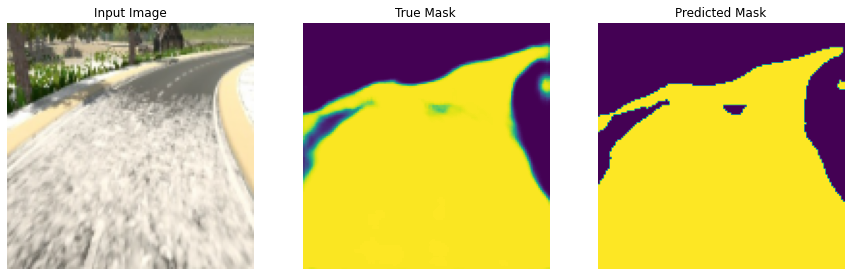

(128, 128, 3)
1/1 [==============================] - 0s 32ms/step
<class 'numpy.ndarray'>


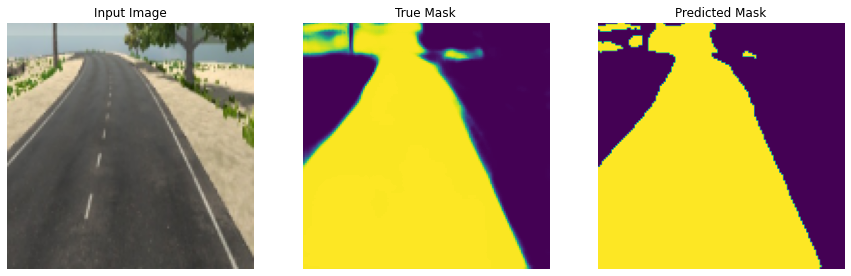

(128, 128, 3)
1/1 [==============================] - 0s 23ms/step
<class 'numpy.ndarray'>


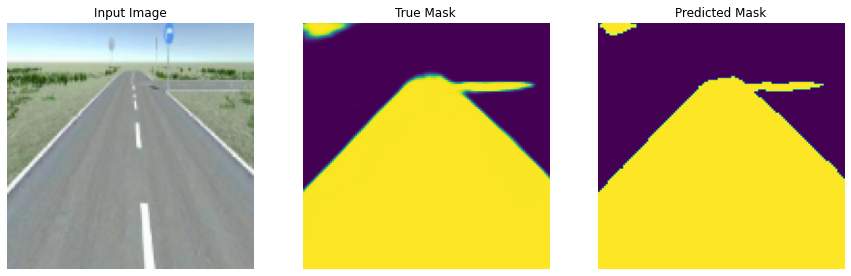

(128, 128, 3)
1/1 [==============================] - 0s 22ms/step
<class 'numpy.ndarray'>


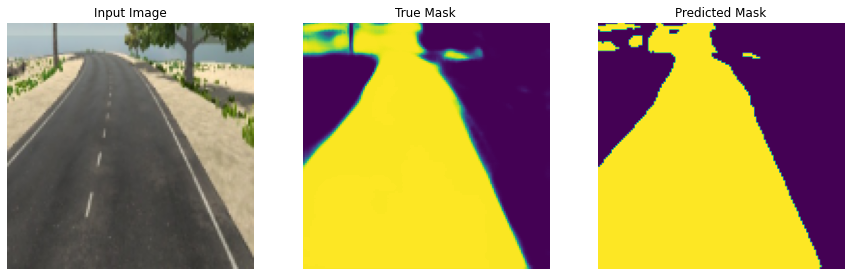

(128, 128, 3)
1/1 [==============================] - 0s 20ms/step
<class 'numpy.ndarray'>


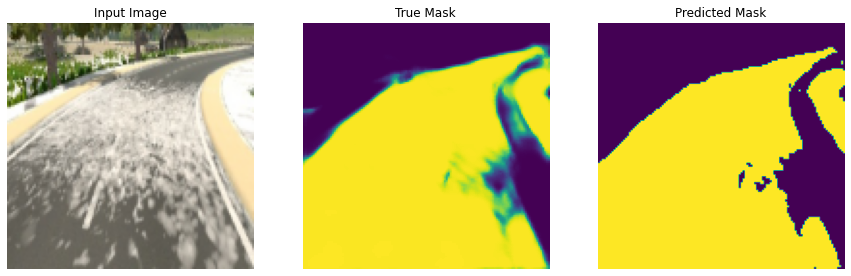

(128, 128, 3)
1/1 [==============================] - 0s 32ms/step
<class 'numpy.ndarray'>


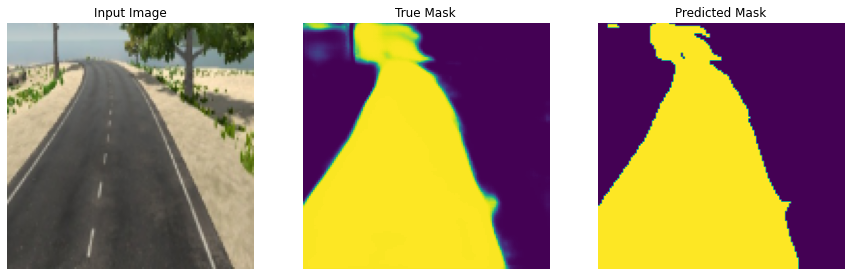

(128, 128, 3)
1/1 [==============================] - 0s 34ms/step
<class 'numpy.ndarray'>


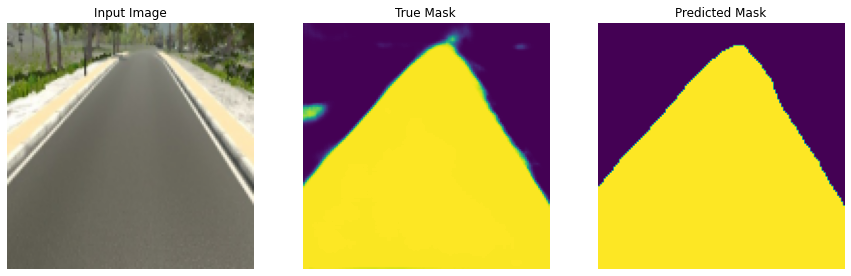

(128, 128, 3)
1/1 [==============================] - 0s 20ms/step
<class 'numpy.ndarray'>


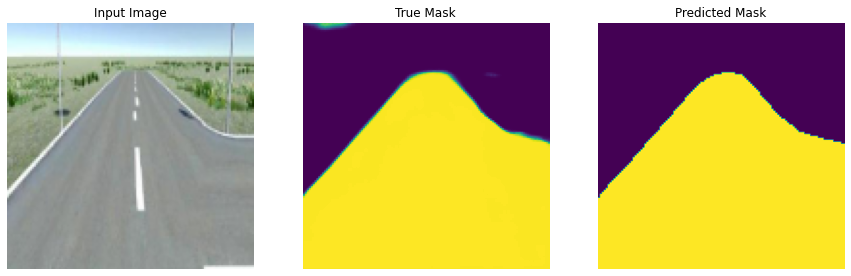

(128, 128, 3)
1/1 [==============================] - 0s 20ms/step
<class 'numpy.ndarray'>


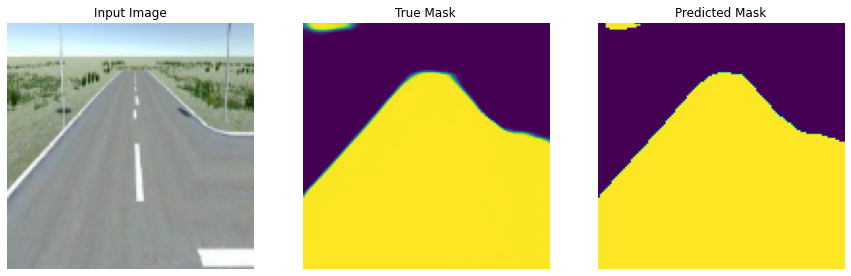

(128, 128, 3)
1/1 [==============================] - 0s 22ms/step
<class 'numpy.ndarray'>


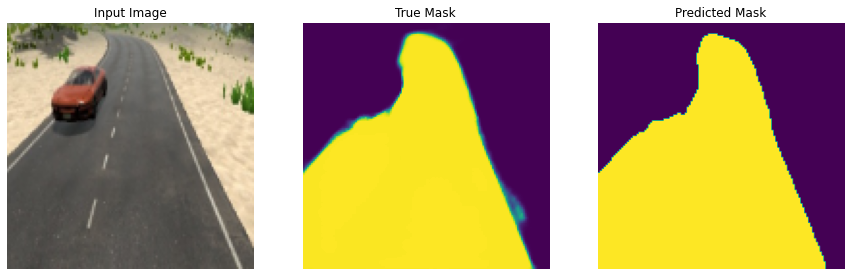

(128, 128, 3)
1/1 [==============================] - 0s 36ms/step
<class 'numpy.ndarray'>


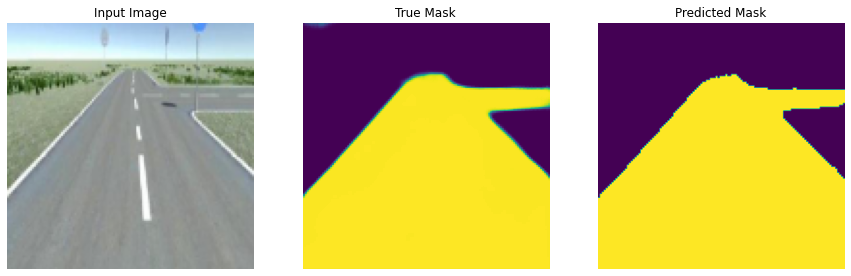

(128, 128, 3)
1/1 [==============================] - 0s 22ms/step
<class 'numpy.ndarray'>


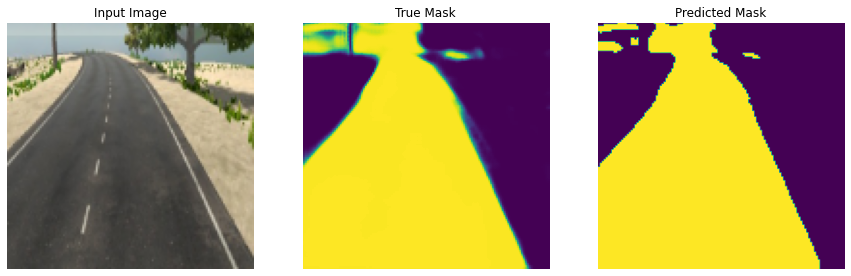

(128, 128, 3)
1/1 [==============================] - 0s 25ms/step
<class 'numpy.ndarray'>


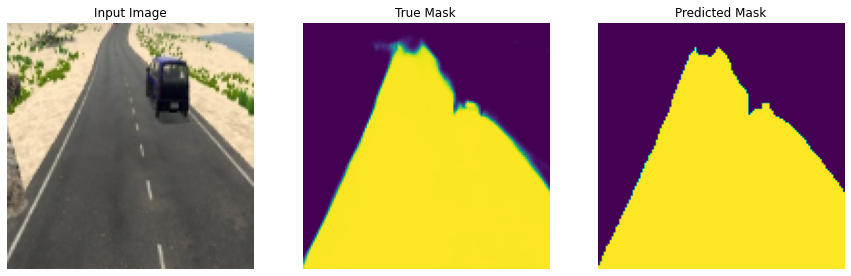

(128, 128, 3)
1/1 [==============================] - 0s 27ms/step
<class 'numpy.ndarray'>


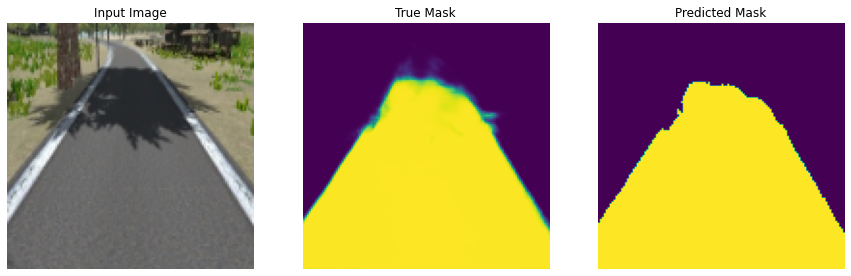

(128, 128, 3)
1/1 [==============================] - 0s 28ms/step
<class 'numpy.ndarray'>


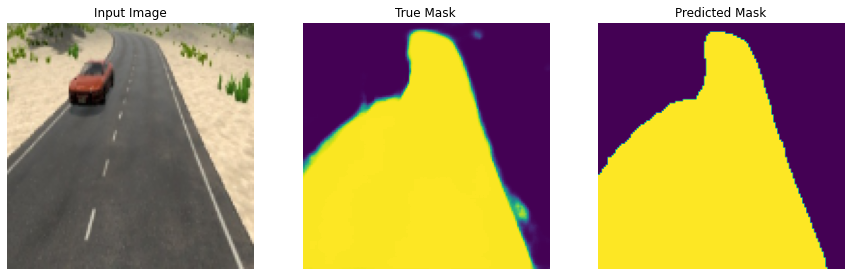

(128, 128, 3)
1/1 [==============================] - 0s 34ms/step
<class 'numpy.ndarray'>


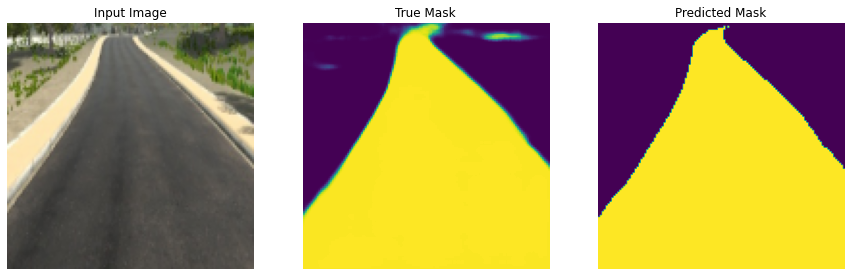

(128, 128, 3)
1/1 [==============================] - 0s 30ms/step
<class 'numpy.ndarray'>


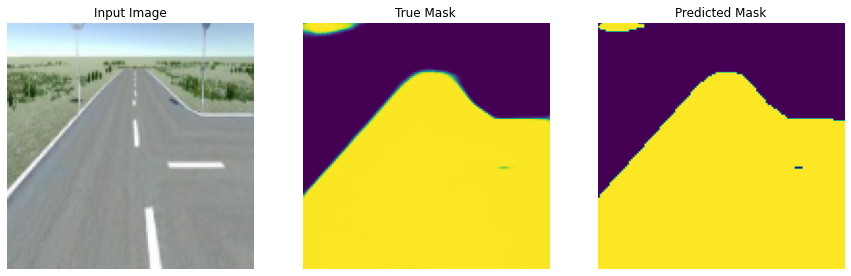

(128, 128, 3)
1/1 [==============================] - 0s 31ms/step
<class 'numpy.ndarray'>


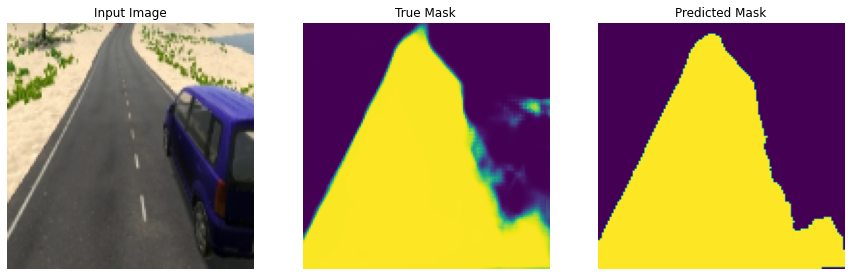

(128, 128, 3)
1/1 [==============================] - 0s 30ms/step
<class 'numpy.ndarray'>


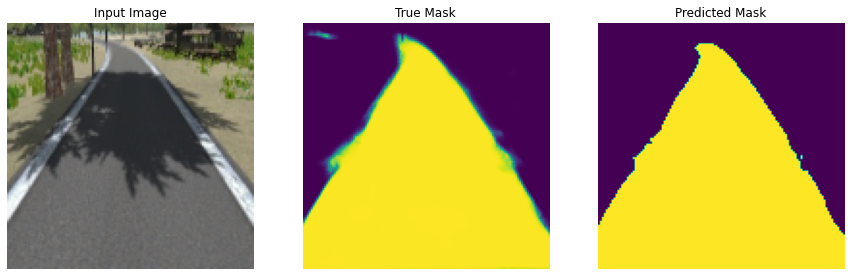

(128, 128, 3)
1/1 [==============================] - 0s 33ms/step
<class 'numpy.ndarray'>


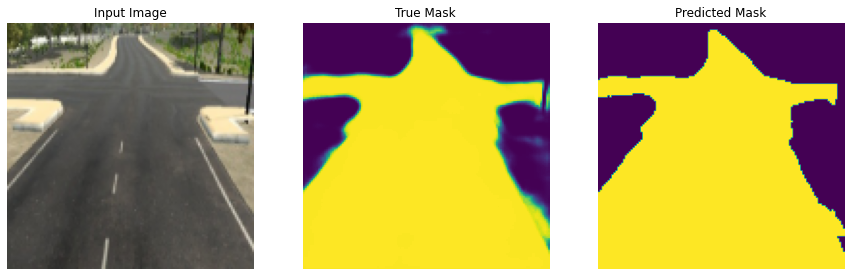

(128, 128, 3)
1/1 [==============================] - 0s 27ms/step
<class 'numpy.ndarray'>


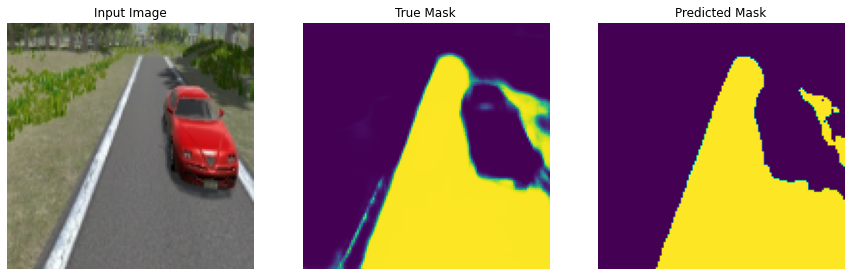

(128, 128, 3)
1/1 [==============================] - 0s 32ms/step
<class 'numpy.ndarray'>


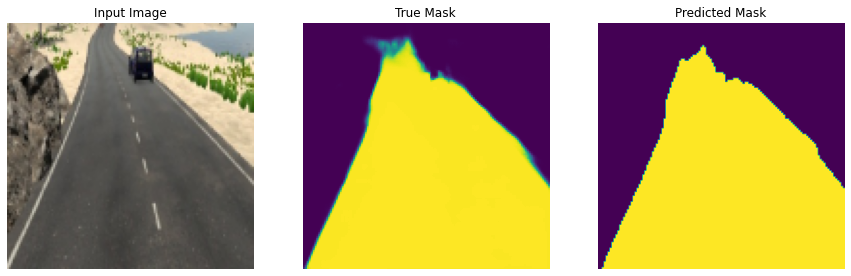

In [ ]:
import cv2
list_file_test = os.listdir('Test_Folder')

for i,name in enumerate(list_file_test):
  img = plt.imread('Test_Folder/'+name)/255
  img = cv2.resize(img,[200,200])
  img = img[40:]
  img = cv2.resize(img,[128,128])

  print(img.shape)
  filter = model.predict( np.array([ img ]))
#   filter = filter>0.9
  print(type(filter))
  display([img,filter[0]])

In [ ]:
from PIL import Image
import cv2
SIZE = 128
img = cv2.imread('/content/F72_2.jpg')
img = tf.image.convert_image_dtype(img,tf.float32)
    # resize
img = tf.image.resize(img, [SIZE, SIZE])
print(img.shape)

a = model.predict(img)
a= create_mask(a)
  # a.set_shape((128,128))
plt.imshow(tf.keras.utils.array_to_img(a))

(128, 128, 3)


InvalidArgumentError: ignored